### **Load Images From Drive**

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
# Replace with the path to the dataset
dataset = '/content/drive/MyDrive/mushroom'

### **Remove Duplicate Images**

In [ ]:
!pip install pillow
!pip install imagehash

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 296.5/296.5 kB 2.3 MB/s eta 0:00:00


In [ ]:
import os
from PIL import Image
import imagehash

# Path to the parent directory
parent_directory = dataset

# List all the items in the directory
all_items = os.listdir(parent_directory)

# Filter out the items that are folders
folder_names = [item for item in all_items if os.path.isdir(os.path.join(parent_directory, item))]


for folder_name in folder_names:
  dir = dataset + folder_name

  unique_hashes = {}
  duplicates = []

  # Identify duplicates
  for filename in os.listdir(dir):
      if filename:
          file_path = os.path.join(dir, filename)
          image = Image.open(file_path)
          image_hash = imagehash.average_hash(image)

          if image_hash in unique_hashes:
              # Found a duplicate
              duplicates.append(file_path)
          else:
              unique_hashes[image_hash] = file_path

  print("Found", len(duplicates), "duplicated files in", folder_name)

  for file_path in duplicates:
      os.remove(file_path)
      print(f"Deleted duplicate file: {file_path}")

print("Duplicate deletion complete.")

Duplicate deletion complete.


### **Split Images into Train, Test, Validation Folder**

Please ignore this procedure if the images have been splited, otherwise the folder will be created again

In [ ]:
import os
import shutil
import random

# Define paths and split ratios
data_dir = dataset
train_dir = dataset + "/train"
test_dir = dataset + "/test"
val_dir = dataset + "/validation"

train_ratio = 0.7
test_ratio = 0.15
val_ratio = 0.15

# Create test directory if it doesn't exist
os.makedirs(test_dir, exist_ok=True)

# Loop through species subfolders
for species_dir in os.listdir(data_dir):
    species_path = os.path.join(data_dir, species_dir)
    if os.path.isdir(species_path):

        # Get all image files
        images = [f for f in os.listdir(species_path) if os.path.isfile(os.path.join(species_path, f))]

        # Shuffle images for random selection
        random.shuffle(images)

        # Calculate total number of images
        num_images = len(images)

        # Calculate test set size
        test_size = int(num_images * test_ratio)

        # Select test images
        test_images = images[:test_size]

        # Create species subfolder within test directory
        os.makedirs(os.path.join(test_dir, species_dir), exist_ok=True)

        # Move test images to the test directory
        for image in test_images:
            shutil.move(os.path.join(species_path, image), os.path.join(test_dir, species_dir, image))

        # Calculate train and validation set sizes from total number of images
        train_size = int(num_images * train_ratio)
        val_size = int(num_images * val_ratio)

        # Split remaining images into train and validation sets
        train_images = images[test_size:test_size + train_size]
        val_images = images[test_size + train_size:test_size + train_size + val_size]

        # Create species subfolders within train and validation directories
        os.makedirs(os.path.join(train_dir, species_dir), exist_ok=True)
        os.makedirs(os.path.join(val_dir, species_dir), exist_ok=True)

        # Move train images to respective folders
        for image in train_images:
            shutil.move(os.path.join(species_path, image), os.path.join(train_dir, species_dir, image))

        # Move validation images to respective folders
        for image in val_images:
            shutil.move(os.path.join(species_path, image), os.path.join(val_dir, species_dir, image))

print("Dataset split completed!")

Dataset split completed!


In [ ]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import tensorflow as tf
import numpy as np
import random
import cv2

tf.random.set_seed(42)
np.random.seed(42)
random.seed(42)

# Train, Test, Validation folder
train_dir = dataset + '/train/'
test_dir = dataset + '/test/'
validation_dir = dataset + '/validation/'

# Image resizing
img_height, img_width = 224, 224

def preprocess_image(image, blur=False, sharpen=False):

    # Optional Denoising (Gaussian Blurring)
    if blur:
        kernel_size = (3, 3)  # Adjust kernel size as needed
        image = cv2.GaussianBlur(image, kernel_size, 0)

    # Optional Sharpening
    if sharpen:
        kernel = np.array([[-1, -1, -1], [-1, 9, -1], [-1, -1, -1]])  # Sharpening kernel
        image = cv2.filter2D(image, -1, kernel)

    return image

# ImageDataGenerator for data augmentation and preprocessing of training data
train_datagen = ImageDataGenerator(
    rescale = 1./255,
    rotation_range = 30,
    width_shift_range = 0.2,
    height_shift_range = 0.2,
    shear_range= 0.2,
    zoom_range = 0.2,
    horizontal_flip = True,
    fill_mode = 'nearest',
    preprocessing_function = preprocess_image,
)

# ImageDataGenerator of test and validation data
validation_datagen = ImageDataGenerator(rescale=1./255)
test_datagen = ImageDataGenerator(rescale=1./255)

# Load and preprocess training images
train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size = (img_height, img_width),
    batch_size = 32,
    class_mode = 'categorical',
    seed=42
)

# Load and preprocess vallidation images
validation_generator = validation_datagen.flow_from_directory(
    validation_dir,
    target_size = (img_height, img_width),
    batch_size = 32,
    class_mode = 'categorical',
    seed=42
)

# Load and preprocess training images
test_generator = test_datagen.flow_from_directory(
    test_dir,
    target_size = (img_height, img_width),
    batch_size = 32,
    class_mode = 'categorical',
    shuffle = False,
    seed=42
)


In [ ]:
import os

# Function to count images in a directory
def count_images(directory):
    all_items = os.listdir(directory)
    folder_names = [item for item in all_items if os.path.isdir(os.path.join(directory, item))]
    counts = {}
    for folder_name in folder_names:
        dir_path = os.path.join(directory, folder_name)
        image_count = len([filename for filename in os.listdir(dir_path) if filename])
        counts[folder_name] = image_count
    return counts

# Dataset directory
dataset = '/content/drive/MyDrive/VegetableImages/mushroom'

# Directories to iterate over
directories = ['train', 'test', 'validation']

# Dictionary to store image counts for each directory
total_counts = {}

# Iterate over directories
for directory in directories:
    dir_path = os.path.join(dataset, directory)
    counts = count_images(dir_path)
    total_counts[directory] = counts

# Print counts
for directory, counts in total_counts.items():
    print(f"\nImage counts for {directory}:")
    for folder_name, count in counts.items():
        print(f"Found {count} images in {folder_name}")



Image counts for train:
Found 490 images in coprinus_comatus
Found 490 images in dictyophora
Found 490 images in Cortinarius
Found 490 images in enoki_mushroom
Found 490 images in bolete
Found 490 images in agaricus_bisporus
Found 490 images in Entoloma
Found 490 images in agrocybe_aegerita
Found 490 images in hen-of-the-woods
Found 490 images in Amanita
Found 490 images in morel
Found 490 images in Lactarius
Found 490 images in shiitake
Found 490 images in tricholoma_flavovirens
Found 490 images in matsutake
Found 490 images in hericium
Found 490 images in pleurotus_eryngii
Found 490 images in hypsizigus_marmoreus
Found 490 images in nameko
Found 490 images in russula_virescens

Image counts for test:
Found 105 images in coprinus_comatus
Found 105 images in dictyophora
Found 105 images in Cortinarius
Found 105 images in enoki_mushroom
Found 105 images in bolete
Found 105 images in agaricus_bisporus
Found 105 images in Entoloma
Found 105 images in agrocybe_aegerita
Found 105 images in

### **Load Dataset & Data Preprocessing**

### **Sample Image from each class**

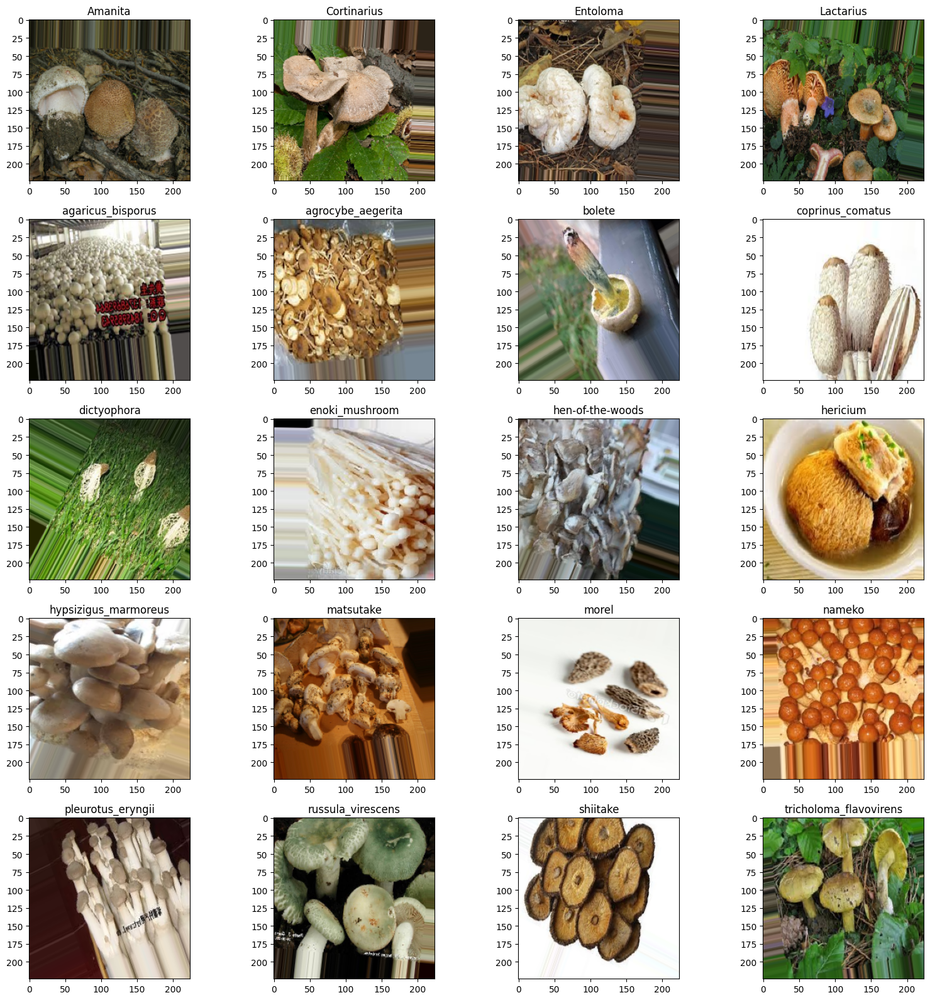

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Get the class names
class_names = train_generator.class_indices.keys()

images, labels = next(train_generator)

plt.figure(figsize=(16, 16))
for i, class_name in enumerate(class_names):
    class_indices = np.where(np.argmax(labels, axis=1) == i)[0]

    if len(class_indices) > 0:
        random_index = np.random.choice(class_indices)
        img = images[random_index]
    else:
        while True:
            images, labels = next(train_generator)
            class_indices = np.where(np.argmax(labels, axis=1) == i)[0]
            if len(class_indices) > 0:
                random_index = np.random.choice(class_indices)
                img = images[random_index]
                break

    plt.subplot(5, 4, i+1)
    plt.imshow(img)
    plt.title(class_name)

plt.tight_layout()
plt.show()


# **Modelling**


## **Build CNN**

In [ ]:
pip install tensorflow==2.9.0

### **VGG16**

In [ ]:
from tensorflow.keras.applications import VGG16
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Flatten, Dense
from tensorflow.keras.optimizers import Adam

num_classes = 20

# Load the pre-trained VGG16 model
vgg_base = VGG16(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Freeze the convolutional layers
for layer in vgg_base.layers:
    layer.trainable = False

# Add custom classification layers on top
x = Flatten()(vgg_base.output)
x = Dense(512, activation='relu')(x)
x = Dense(256, activation='relu')(x)
output = Dense(num_classes, activation='softmax')(x)

# Create the model
vgg16 = Model(inputs=vgg_base.input, outputs=output)

# Compile the model
vgg16.compile(optimizer=Adam(lr=0.001), loss='categorical_crossentropy', metrics=['accuracy'])

# Print model summary
vgg16.summary()


58889256/58889256 [==============================] - 0s 0us/step


Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_4 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)       0     

In [ ]:
from tensorflow.keras.callbacks import EarlyStopping, Callback, CSVLogger
# Define early stopping callback
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
csv_logger = CSVLogger(dataset + "/evaluation/vgg16_training_log.csv")

# Train the model
vgg16_his = vgg16.fit(train_generator,
                    steps_per_epoch=train_generator.samples // train_generator.batch_size,
                    epochs=30,
                    validation_data=validation_generator,
                    validation_steps=validation_generator.samples // validation_generator.batch_size,
                      callbacks=[early_stopping, csv_logger])

y_pred = vgg16.predict(test_generator)
print(y_pred)

### ResNet

In [ ]:
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Flatten, Dense
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping

# Load the pre-trained ResNet50 model
resnet_base = ResNet50(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Freeze the convolutional layers
for layer in resnet_base.layers:
    layer.trainable = False

# Add custom classification layers on top
x = Flatten()(resnet_base.output)
x = Dense(512, activation='relu')(x)
x = Dense(256, activation='relu')(x)
output = Dense(20, activation='softmax')(x)

# Create the model
resNet = Model(inputs=resnet_base.input, outputs=output)

# Compile the model
resNet.compile(optimizer=Adam(), loss='categorical_crossentropy', metrics=['accuracy'])

# Print model summary
resNet.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_2 (InputLayer)        [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 conv1_pad (ZeroPadding2D)   (None, 230, 230, 3)          0         ['input_2[0][0]']             
                                                                                                  
 conv1_conv (Conv2D)         (None, 112, 112, 64)         9472      ['conv1_pad[0][0]']           
                                                                                                  
 conv1_bn (BatchNormalizati  (None, 112, 112, 64)         256       ['conv1_conv[0][0]']          
 on)                                                                                          

In [ ]:
# Define early stopping callback
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
csv_logger = CSVLogger(dataset + "/evaluation/resNet_training_log.csv")

# Train the model
resNet_his = resNet.fit(train_generator,
                    steps_per_epoch=train_generator.samples // train_generator.batch_size,
                    epochs=30,
                    validation_data=validation_generator,
                    validation_steps=validation_generator.samples // validation_generator.batch_size,
                    callbacks=[early_stopping, csv_logger])

resNet.save(dataset + "/evaluation/resNet.h5")

###DenseNet

In [ ]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import DenseNet121
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import SGD
import numpy as np

base_model = DenseNet121(weights='imagenet', include_top=False)  # Load pre-trained weights

# Add custom classification head
x = base_model.output
x = GlobalAveragePooling2D()(x)
predictions = Dense(20, activation='softmax')(x)

# Combine base model and custom classification head
denseNet = Model(inputs=base_model.input, outputs=predictions)

# Freeze layers in the base model
for layer in base_model.layers:
    layer.trainable = False

denseNet.compile(optimizer=SGD(learning_rate=0.001, momentum=0.9), loss='categorical_crossentropy', metrics=['accuracy'])
denseNet.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_2 (InputLayer)        [(None, None, None, 3)]      0         []                            
                                                                                                  
 zero_padding2d_2 (ZeroPadd  (None, None, None, 3)        0         ['input_2[0][0]']             
 ing2D)                                                                                           
                                                                                                  
 conv1/conv (Conv2D)         (None, None, None, 64)       9408      ['zero_padding2d_2[0][0]']    
                                                                                                  
 conv1/bn (BatchNormalizati  (None, None, None, 64)       256       ['conv1/conv[0][0]']    

In [ ]:
from tensorflow.keras.callbacks import EarlyStopping, Callback, CSVLogger
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
csv_logger = CSVLogger(dataset + "/evaluation/denseNet_training_log.csv")
# Train the model
denseNet_his = denseNet.fit(train_generator, epochs=30, validation_data=validation_generator, callbacks=[early_stopping, csv_logger])

# Evaluate the model on the test set
accuracy = denseNet.evaluate(test_generator)[1]
print("Test Accuracy:", accuracy)
denseNet.save(dataset + "/evaluation/denseNet.h5")

### **GoogLeNet (Inception)**


In [ ]:
from tensorflow.keras.applications import InceptionV3
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D
from tensorflow.keras.models import Model

# Load pre-trained InceptionV3
base_model = InceptionV3(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Add custom classification head
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(1024, activation='relu')(x)
predictions = Dense(20, activation='sigmoid')(x)

inception = Model(inputs=base_model.input, outputs=predictions)

# Freeze pre-trained layers
for layer in base_model.layers:
    layer.trainable = False

# Compile the model
inception.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
inception.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_3 (InputLayer)        [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 conv2d_94 (Conv2D)          (None, 111, 111, 32)         864       ['input_3[0][0]']             
                                                                                                  
 batch_normalization_94 (Ba  (None, 111, 111, 32)         96        ['conv2d_94[0][0]']           
 tchNormalization)                                                                                
                                                                                                  
 activation_94 (Activation)  (None, 111, 111, 32)         0         ['batch_normalization_94

In [ ]:
from tensorflow.keras.callbacks import EarlyStopping, Callback, CSVLogger

csv_logger = CSVLogger(dataset + "/evaluation/inception_training_log.csv")
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
# Train the model
inception_his = inception.fit(train_generator,
                    epochs=30,
                    validation_data=validation_generator, callbacks=[early_stopping, csv_logger])

# Evaluate the model on test data
accuracy = inception.evaluate(test_generator)[1]
print("Test Accuracy:", accuracy)
vit.save(dataset + "/evaluation/inception.h5")

### MobileNet

In [ ]:
from tensorflow.keras.applications import MobileNet
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D
from tensorflow.keras.models import Model

# Load pre-trained MobileNet
base_model = MobileNet(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Add custom classification head
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(1024, activation='relu')(x)
predictions = Dense(20, activation='sigmoid')(x)

mobilenet = Model(inputs=base_model.input, outputs=predictions)

# Freeze pre-trained layers
for layer in base_model.layers:
    layer.trainable = False

# Compile the model
mobilenet.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
mobilenet.summary()


Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 conv1 (Conv2D)              (None, 112, 112, 32)      864       
                                                                 
 conv1_bn (BatchNormalizati  (None, 112, 112, 32)      128       
 on)                                                             
                                                                 
 conv1_relu (ReLU)           (None, 112, 112, 32)      0         
                                                                 
 conv_dw_1 (DepthwiseConv2D  (None, 112, 112, 32)      288       
 )                                                               
                                                                 
 conv_dw_1_bn (BatchNormali  (None, 112, 112, 32)      128   

In [ ]:
from tensorflow.keras.callbacks import EarlyStopping, Callback, CSVLogger

csv_logger = CSVLogger(dataset + "/evaluation/mobileNet_training_log.csv")
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
# Train the model
mobilenet_his = mobilenet.fit(train_generator,
                    epochs=30,
                    validation_data=validation_generator, callbacks=[early_stopping, csv_logger])

# Evaluate the model on test data
accuracy = mobilenet.evaluate(test_generator)[1]
print("Test Accuracy:", accuracy)
vit.save(dataset + "/evaluation/mobileNet.h5")

### **Xception**

In [ ]:
from tensorflow.keras.applications import Xception
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D
from tensorflow.keras.models import Model

# Load pre-trained Xception
base_model = Xception(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Add custom classification head
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(1024, activation='relu')(x)
predictions = Dense(20, activation='sigmoid')(x)

xception= Model(inputs=base_model.input, outputs=predictions)

# Freeze pre-trained layers
for layer in base_model.layers:
    layer.trainable = False

# Compile the model
xception.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
xception.summary()


83683744/83683744 [==============================] - 4s 0us/step
Model: "model_4"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_7 (InputLayer)        [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 block1_conv1 (Conv2D)       (None, 111, 111, 32)         864       ['input_7[0][0]']             
                                                                                                  
 block1_conv1_bn (BatchNorm  (None, 111, 111, 32)         128       ['block1_conv1[0][0]']        
 alization)                                                                                       
                                                                                                  
 block1_conv1_act (Activati

In [ ]:
from tensorflow.keras.callbacks import EarlyStopping, Callback, CSVLogger

csv_logger = CSVLogger(dataset + "/evaluation/xception_training_log.csv")
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
# Train the model
xception_his = xception.fit(train_generator,
                    epochs=30,
                    validation_data=validation_generator, callbacks=[early_stopping, csv_logger])

# Evaluate the model on test data
accuracy = xception.evaluate(test_generator)[1]
print("Test Accuracy:", accuracy)
vit.save(dataset + "/evaluation/xception.h5")

### **KNN**

In [ ]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score
from sklearn.preprocessing import LabelEncoder
import numpy as np
import joblib

In [ ]:
# Extract features from training and validation data using the generators
X_train, y_train = [], []
for _ in range(len(train_generator)):
    images, labels = train_generator.next()
    features = np.array(images)  # Assuming you want to use raw pixel values as features
    X_train.extend(features)
    y_train.extend(labels)

X_val, y_val = [], []
for _ in range(len(validation_generator)):
    images, labels = validation_generator.next()
    features = np.array(images)  # Assuming you want to use raw pixel values as features
    X_val.extend(features)
    y_val.extend(labels)

# Flatten the feature arrays
X_train_flat = np.array(X_train).reshape(len(X_train), -1)
X_val_flat = np.array(X_val).reshape(len(X_val), -1)

# Encode class labels
label_encoder = LabelEncoder()
y_train_encoded = label_encoder.fit_transform(np.argmax(y_train, axis=1))
y_val_encoded = label_encoder.transform(np.argmax(y_val, axis=1))

In [ ]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score
from sklearn.model_selection import train_test_split
import numpy as np

# Train k-Nearest Neighbors (kNN) classifier
knn = KNeighborsClassifier(n_neighbors=5)  # You can adjust the number of neighbors
knn.fit(X_train_flat, y_train_encoded)
joblib.dump(dataset + "/evaluation/knn.pkl")

### **Random Forest**

In [ ]:
# Train Random Forest classifier
rf = RandomForestClassifier(n_estimators=100)  # You can adjust the number of trees
rf.fit(X_train_flat, y_train_encoded)
joblib.dump(dataset + "/evaluation/rf.pkl")

# **Evaluation**

For CNN

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
from sklearn.metrics import classification_report, confusion_matrix
from tensorflow.keras.models import load_model

def evaluate_model(model_path, history_path, test_generator):
    # Load the trained model
    model = load_model(model_path)
    history_df = pd.read_csv(history_path)

    # Evaluate on the test set to get test accuracy
    test_loss, test_accuracy = model.evaluate(test_generator)
    print("Test Loss:", test_loss)
    print("Test Accuracy:", test_accuracy)

    # Access the metrics from the loaded history
    epochs = history_df['epoch']
    train_loss = history_df['loss']
    val_loss = history_df['val_loss']
    train_acc = history_df['accuracy']
    val_acc = history_df['val_accuracy']

    # Plot training and validation accuracy
    plt.plot(epochs, train_acc, label='Training Accuracy')
    plt.plot(epochs, val_acc, label='Validation Accuracy')
    plt.title('Training and Validation Accuracy')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.legend()
    plt.show()

    # Plot training and validation loss
    plt.plot(epochs, train_loss, label='Training Loss')
    plt.plot(epochs, val_loss, label='Validation Loss')
    plt.title('Training and Validation Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    plt.show()

    # Generate predictions on the test set
    predictions = model.predict(test_generator)
    y_pred = np.argmax(predictions, axis=1)
    y_true = test_generator.classes

    # Compute and print classification report
    class_names = list(test_generator.class_indices.keys())
    print("Classification Report:")
    print(classification_report(y_true, y_pred, target_names=class_names))

    # Plot confusion matrix
    cm = confusion_matrix(y_true, y_pred)
    plt.figure(figsize=(16, 10))
    plt.imshow(cm, interpolation='nearest', cmap=plt.cm.Blues)
    plt.title('Confusion Matrix', fontsize=16)
    plt.colorbar()
    tick_marks = np.arange(len(class_names))
    plt.xticks(tick_marks, class_names, rotation=60, fontsize=10)
    plt.yticks(tick_marks, class_names, fontsize=12)
    plt.xlabel('Predicted Label', fontsize=14)
    plt.ylabel('True Label', fontsize=14)

    thresh = cm.max() / 3.
    for i in range(cm.shape[0]):
        for j in range(cm.shape[1]):
            plt.text(j, i, format(cm[i, j], 'd'),
                     horizontalalignment="center",
                     color="white" if cm[i, j] > thresh else "black",
                     fontsize=12)

    plt.tight_layout()
    plt.show()


For Others ML

In [ ]:
import joblib
import numpy as np
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report

def evaluate_validation_with_generator(model_path, test_generator):

    knn_model = joblib.load(model_path)

    X_test = []
    y_test = []

    for _ in range(len(test_generator)):
        images, labels = test_generator.next()
        X_test.extend(images)
        y_test.extend(labels)


    X_test_flat = np.array(X_test).reshape(len(X_test), -1)

    y_pred_knn_val = knn_model.predict(X_test_flat)

    y_test_categorical = np.argmax(y_test, axis=1)

    # Calculate accuracy
    accuracy_knn_val = accuracy_score(y_test_categorical, y_pred_knn_val)
    print("Accuracy:", accuracy_knn_val)


    # Calculate classification report
    class_report_knn_test = classification_report(y_test_categorical, y_pred_knn_val)
    print("Classification Report:")
    print(class_report_knn_test)

    # Calculate confusion matrix
    conf_matrix_knn_test = confusion_matrix(y_test_categorical, y_pred_knn_val)
    print("Confusion Matrix:")
    print(conf_matrix_knn_test)



## **Model With Augmentation**

### **VGG16**

43/66 [==================>...........] - ETA: 7:29 - loss: 1.1615 - accuracy: 0.6701

/usr/local/lib/python3.10/dist-packages/PIL/Image.py:996: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


66/66 [==============================] - 1250s 19s/step - loss: 1.2089 - accuracy: 0.6657
Test Loss: 1.2089152336120605
Test Accuracy: 0.6657142639160156


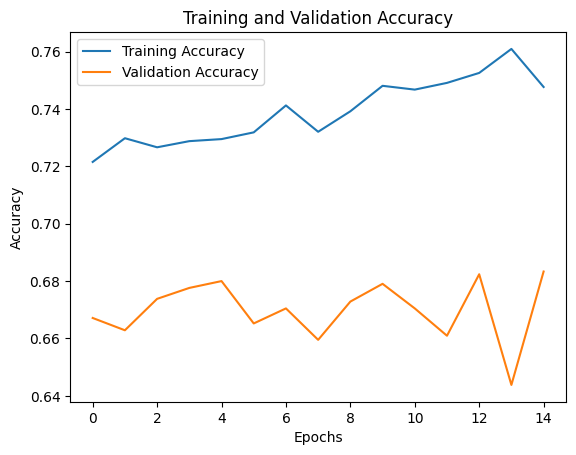

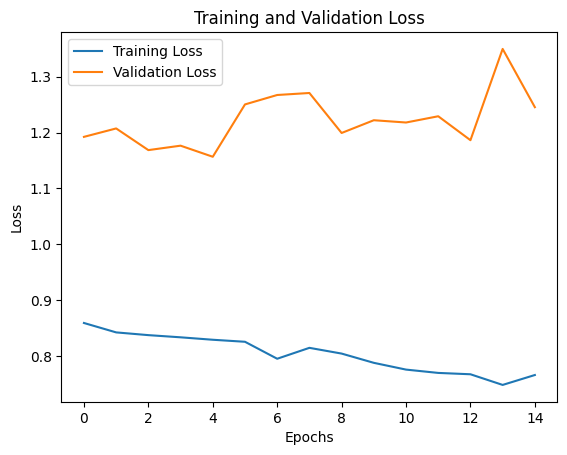

66/66 [==============================] - 1172s 18s/step
Classification Report:
                        precision    recall  f1-score   support

               Amanita       0.54      0.67      0.60       105
           Cortinarius       0.57      0.48      0.52       105
              Entoloma       0.56      0.63      0.59       105
             Lactarius       0.58      0.41      0.48       105
     agaricus_bisporus       0.69      0.77      0.73       105
     agrocybe_aegerita       0.70      0.68      0.69       105
                bolete       0.65      0.59      0.62       105
      coprinus_comatus       0.67      0.82      0.74       105
           dictyophora       0.59      0.81      0.68       105
        enoki_mushroom       0.79      0.72      0.76       105
      hen-of-the-woods       0.84      0.77      0.81       105
              hericium       0.87      0.70      0.77       105
  hypsizigus_marmoreus       0.63      0.68      0.65       105
             matsutake  

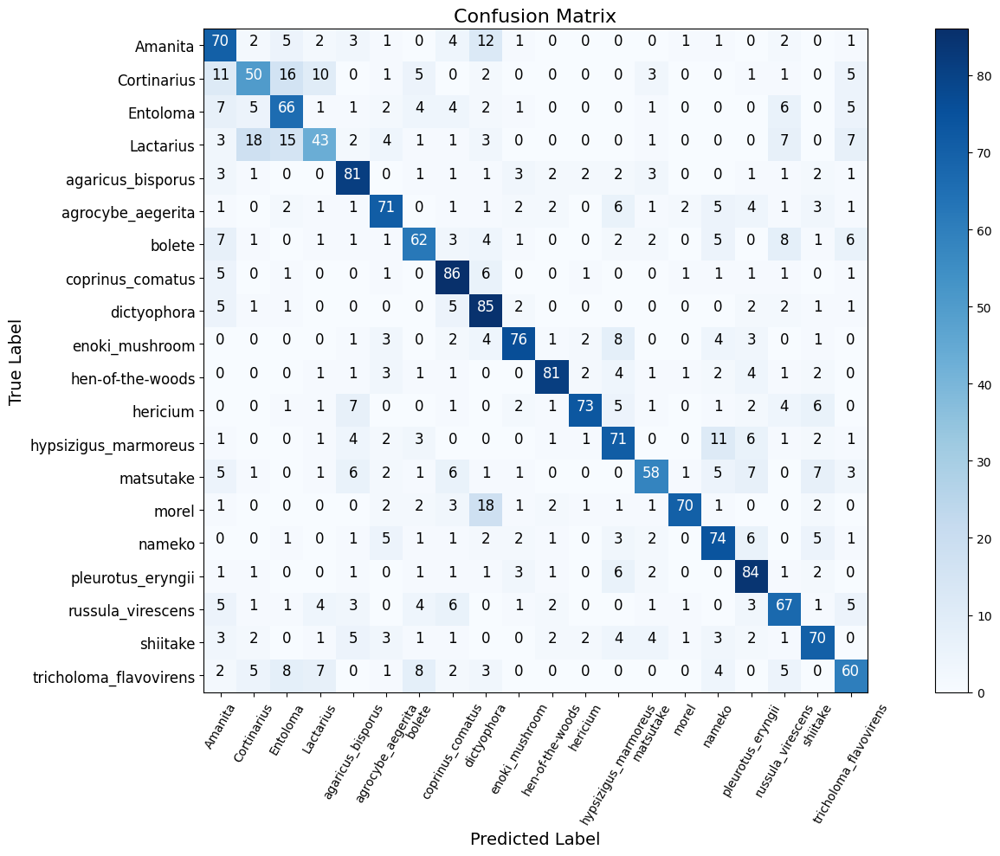

In [ ]:
model_path = dataset + "/evaluation/wo_image_processing/VGG-16.h5"
history_path = dataset + "/evaluation/wo_image_processing/VGG-16_training_log.csv"
evaluate_model(model_path, history_path, test_generator)

### **ResNet**

43/66 [==================>...........] - ETA: 2:22 - loss: 2.5889 - accuracy: 0.1686

/usr/local/lib/python3.10/dist-packages/PIL/Image.py:996: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


66/66 [==============================] - 405s 6s/step - loss: 2.6453 - accuracy: 0.1610
Test Loss: 2.645280122756958
Test Accuracy: 0.1609523743391037


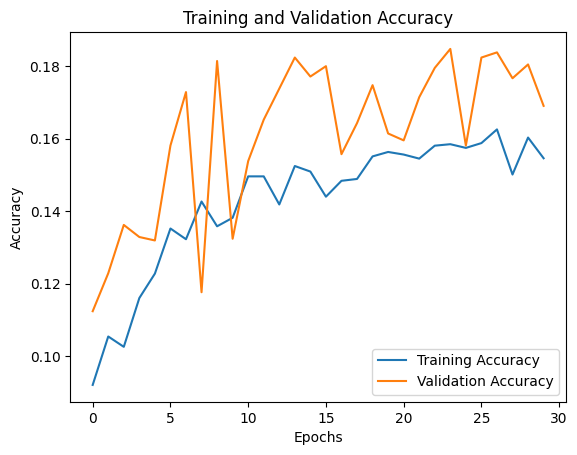

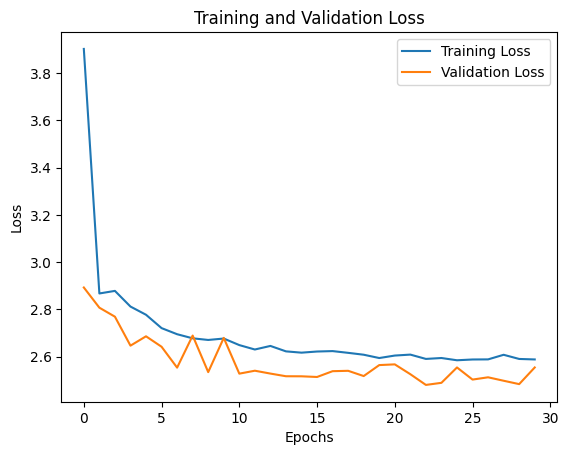

66/66 [==============================] - 409s 6s/step
Classification Report:
                        precision    recall  f1-score   support

               Amanita       0.01      0.01      0.01       105
           Cortinarius       0.16      0.56      0.25       105
              Entoloma       0.00      0.00      0.00       105
             Lactarius       0.14      0.51      0.23       105
     agaricus_bisporus       0.20      0.06      0.09       105
     agrocybe_aegerita       0.10      0.06      0.07       105
                bolete       0.05      0.02      0.03       105
      coprinus_comatus       0.00      0.00      0.00       105
           dictyophora       0.16      0.12      0.14       105
        enoki_mushroom       0.08      0.01      0.02       105
      hen-of-the-woods       0.00      0.00      0.00       105
              hericium       0.19      0.62      0.30       105
  hypsizigus_marmoreus       0.35      0.22      0.27       105
             matsutake    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


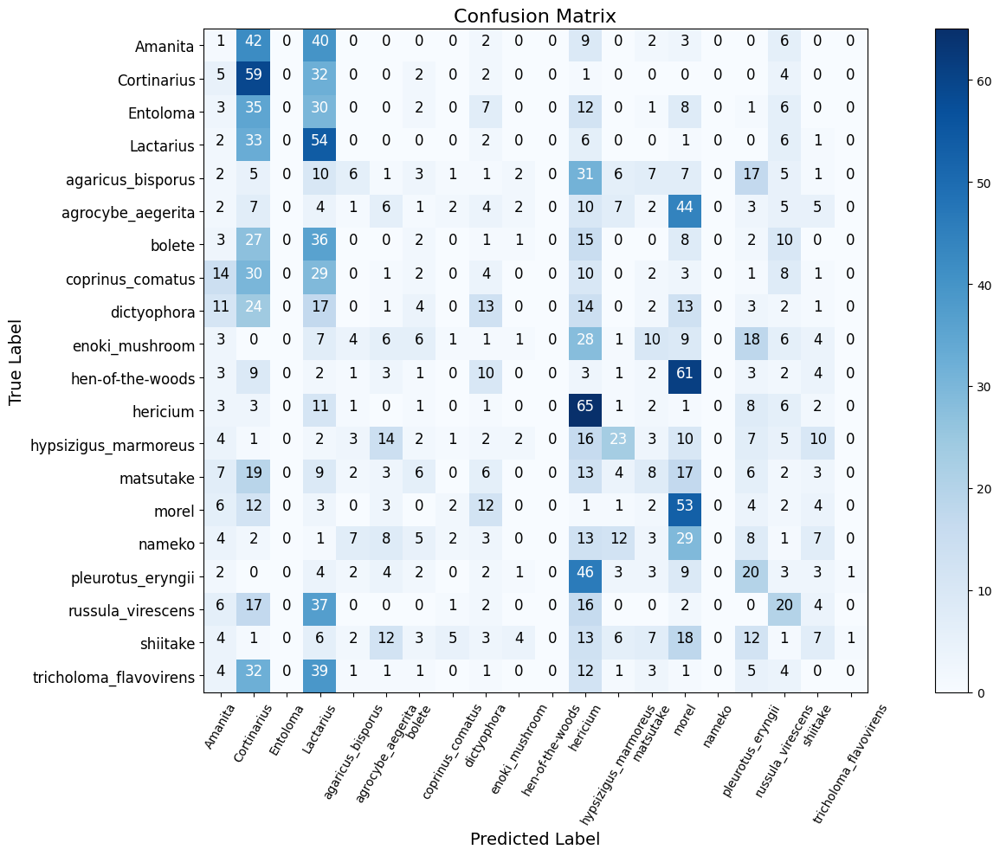

In [ ]:
model_path = dataset + "/evaluation/wo_image_processing/ResNet50.h5"
history_path = dataset + "/evaluation/wo_image_processing/ResNet50_training_log.csv"
evaluate_model(model_path, history_path, test_generator)

### **DenseNet**

43/66 [==================>...........] - ETA: 2:21 - loss: 0.6449 - accuracy: 0.7972

/usr/local/lib/python3.10/dist-packages/PIL/Image.py:996: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


66/66 [==============================] - 407s 6s/step - loss: 0.7175 - accuracy: 0.7795
Test Loss: 0.7175121903419495
Test Accuracy: 0.7795237898826599


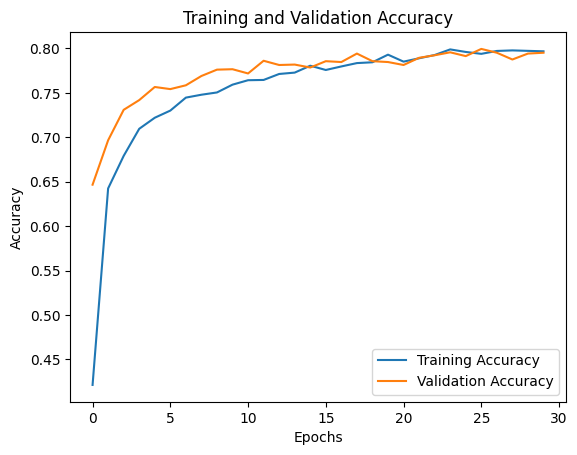

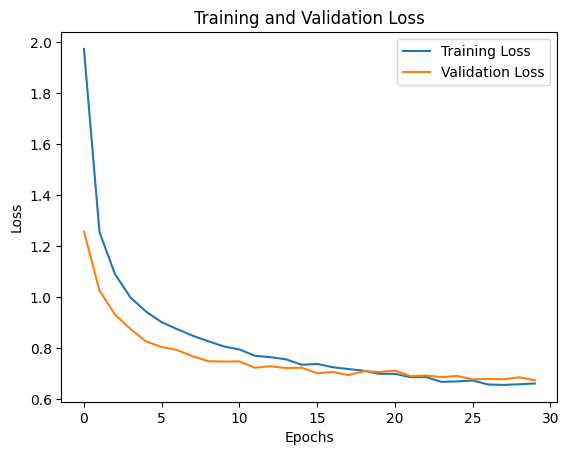

66/66 [==============================] - 397s 6s/step
Classification Report:
                        precision    recall  f1-score   support

               Amanita       0.60      0.96      0.74       105
           Cortinarius       0.62      0.76      0.68       105
              Entoloma       0.72      0.69      0.70       105
             Lactarius       0.72      0.55      0.62       105
     agaricus_bisporus       0.71      0.78      0.75       105
     agrocybe_aegerita       0.78      0.76      0.77       105
                bolete       0.74      0.77      0.76       105
      coprinus_comatus       0.88      0.94      0.91       105
           dictyophora       0.93      0.86      0.89       105
        enoki_mushroom       0.92      0.85      0.88       105
      hen-of-the-woods       0.96      0.84      0.89       105
              hericium       0.95      0.85      0.89       105
  hypsizigus_marmoreus       0.79      0.75      0.77       105
             matsutake    

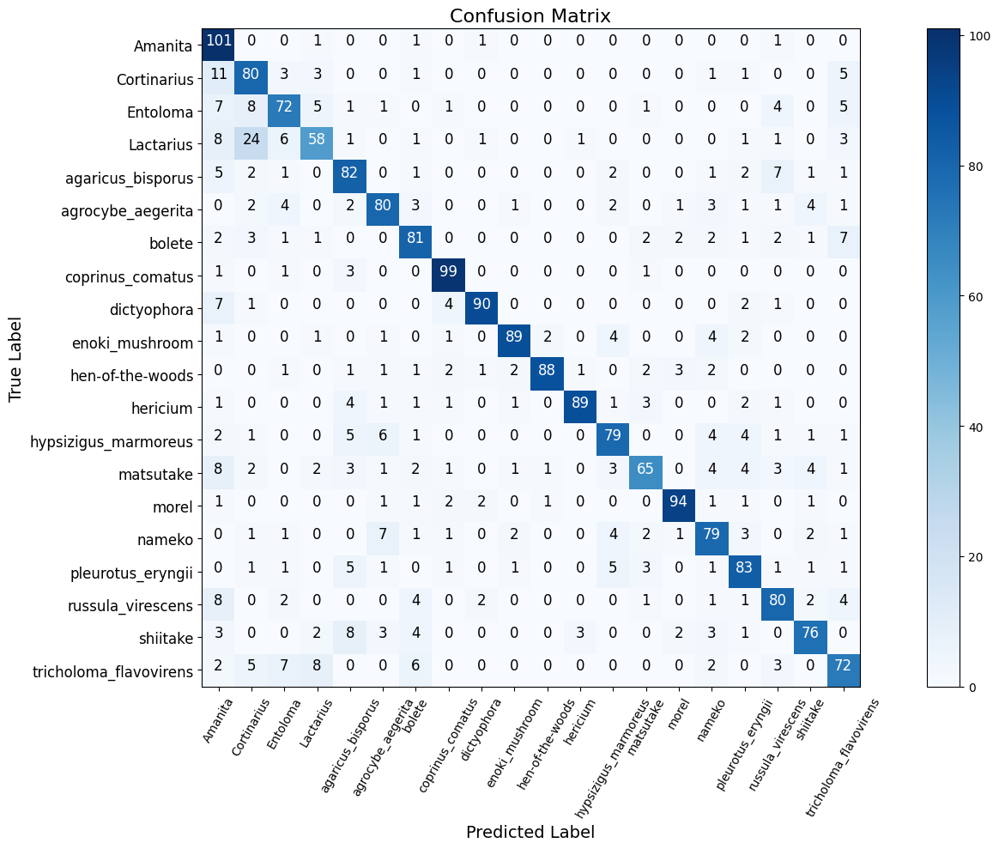

In [ ]:
model_path = dataset + "/evaluation/DenseNet121.h5"
history_path = dataset + "/evaluation/DenseNet121_training_log.csv"
evaluate_model(model_path, history_path, test_generator)

### **GoogLeNet (Inception)**

43/66 [==================>...........] - ETA: 1:27 - loss: 0.0556 - accuracy: 0.7987

/usr/local/lib/python3.10/dist-packages/PIL/Image.py:996: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


66/66 [==============================] - 248s 4s/step - loss: 0.0643 - accuracy: 0.7629
Test Loss: 0.06433995068073273
Test Accuracy: 0.7628571391105652


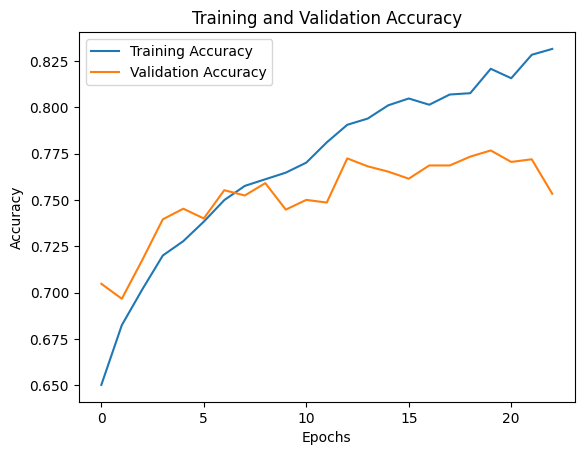

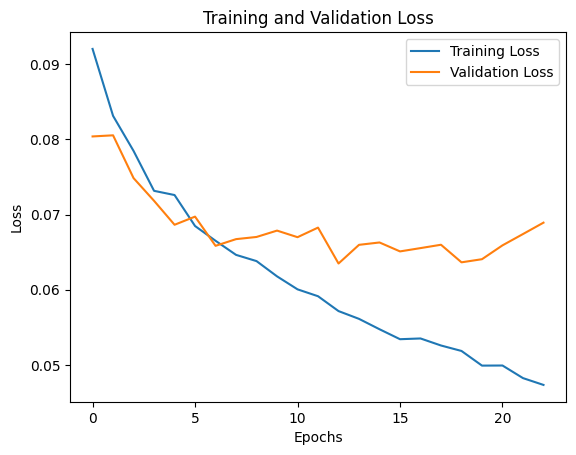

66/66 [==============================] - 238s 4s/step
Classification Report:
                        precision    recall  f1-score   support

               Amanita       0.67      0.85      0.75       105
           Cortinarius       0.60      0.67      0.63       105
              Entoloma       0.71      0.65      0.68       105
             Lactarius       0.63      0.71      0.67       105
     agaricus_bisporus       0.80      0.73      0.77       105
     agrocybe_aegerita       0.61      0.82      0.70       105
                bolete       0.64      0.85      0.73       105
      coprinus_comatus       0.93      0.88      0.90       105
           dictyophora       0.87      0.91      0.89       105
        enoki_mushroom       0.91      0.88      0.89       105
      hen-of-the-woods       0.76      0.88      0.81       105
              hericium       0.91      0.87      0.89       105
  hypsizigus_marmoreus       0.87      0.69      0.77       105
             matsutake    

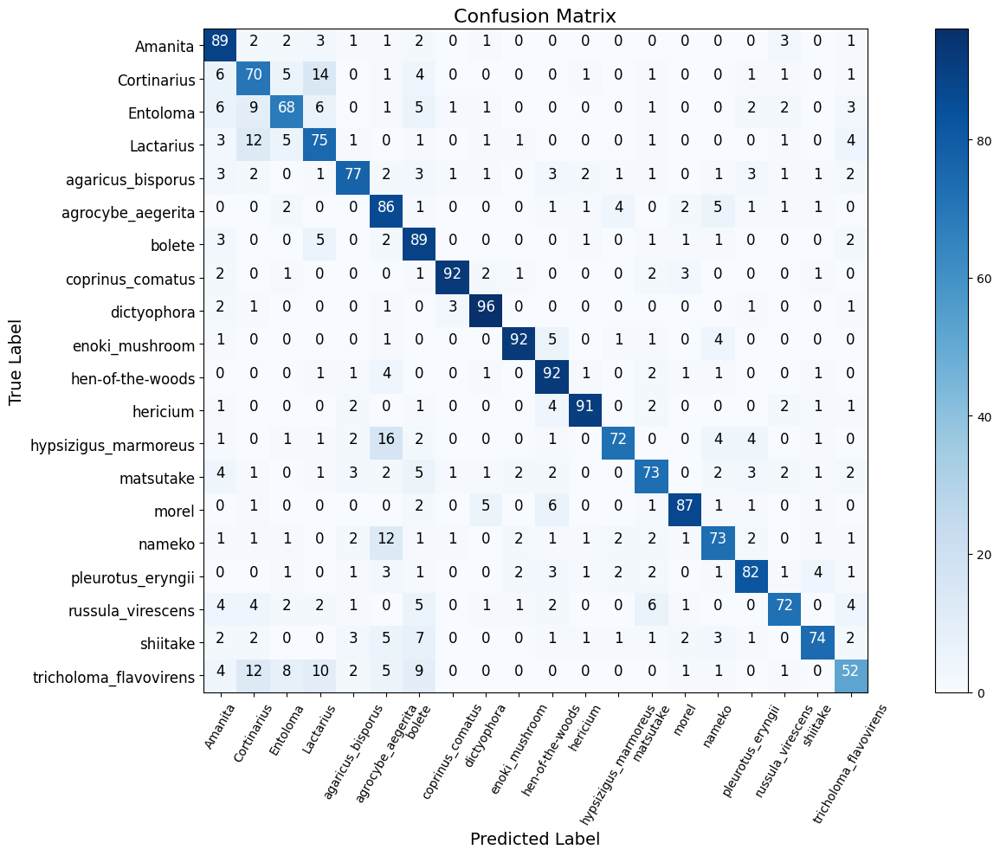

In [ ]:
model_path = dataset + "/evaluation/wo_image_processing/inception.h5"
history_path = dataset + "/evaluation/wo_image_processing/inception_training_log.csv"
evaluate_model(model_path, history_path, test_generator)

### **MobileNet**

43/66 [==================>...........] - ETA: 47s - loss: 0.0511 - accuracy: 0.8299

/usr/local/lib/python3.10/dist-packages/PIL/Image.py:996: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


66/66 [==============================] - 149s 2s/step - loss: 0.0556 - accuracy: 0.8143
Test Loss: 0.05555615946650505
Test Accuracy: 0.8142856955528259


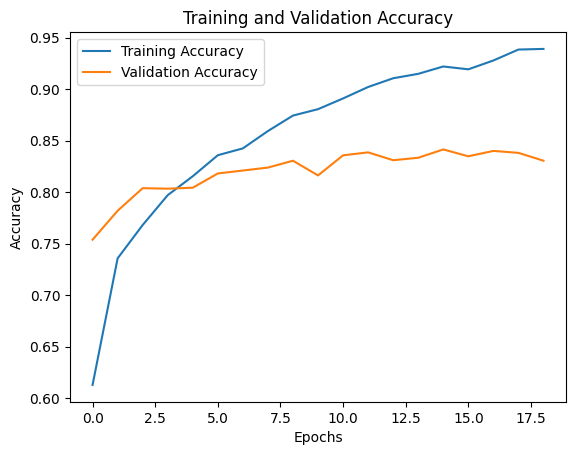

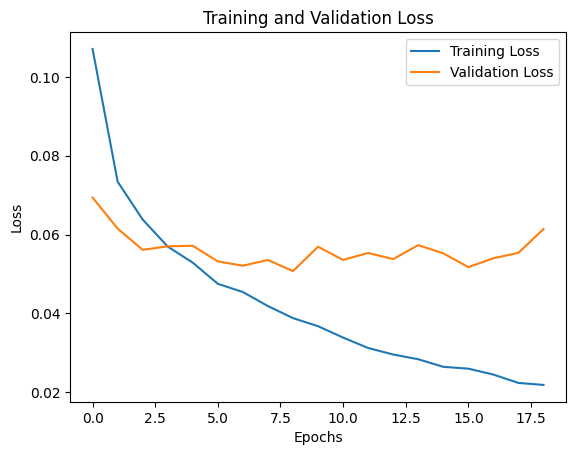

66/66 [==============================] - 106s 2s/step
Classification Report:
                        precision    recall  f1-score   support

               Amanita       0.83      0.82      0.82       105
           Cortinarius       0.67      0.85      0.75       105
              Entoloma       0.73      0.73      0.73       105
             Lactarius       0.84      0.68      0.75       105
     agaricus_bisporus       0.72      0.85      0.78       105
     agrocybe_aegerita       0.72      0.80      0.76       105
                bolete       0.81      0.83      0.82       105
      coprinus_comatus       0.98      0.89      0.93       105
           dictyophora       0.92      0.86      0.89       105
        enoki_mushroom       0.97      0.88      0.92       105
      hen-of-the-woods       0.91      0.91      0.91       105
              hericium       0.93      0.90      0.91       105
  hypsizigus_marmoreus       0.81      0.80      0.80       105
             matsutake    

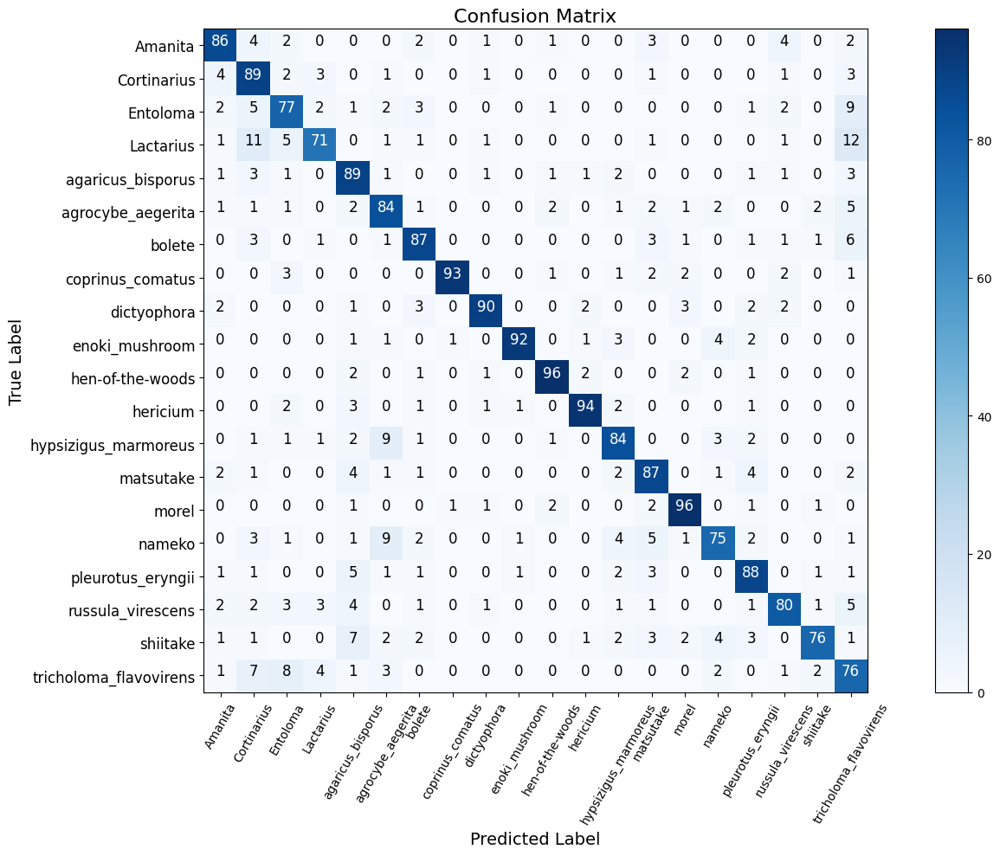

In [ ]:
model_path = dataset + "/evaluation/wo_image_processing/mobilenet.h5"
history_path = dataset + "/evaluation/wo_image_processing/mobileNet_training_log.csv"
evaluate_model(model_path, history_path, test_generator)

### **Xception**

43/66 [==================>...........] - ETA: 2:33 - loss: 0.0563 - accuracy: 0.8096

/usr/local/lib/python3.10/dist-packages/PIL/Image.py:996: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


66/66 [==============================] - 445s 7s/step - loss: 0.0636 - accuracy: 0.7714
Test Loss: 0.06364698708057404
Test Accuracy: 0.7714285850524902


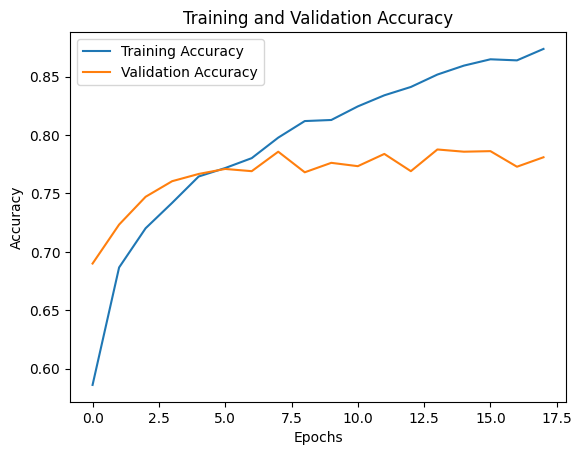

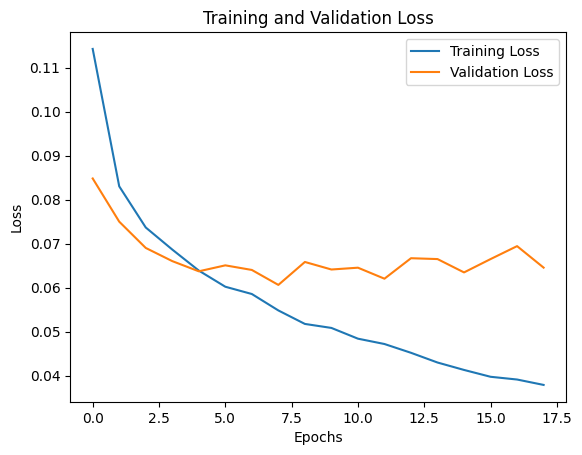

66/66 [==============================] - 449s 7s/step
Classification Report:
                        precision    recall  f1-score   support

               Amanita       0.78      0.78      0.78       105
           Cortinarius       0.56      0.76      0.65       105
              Entoloma       0.56      0.77      0.65       105
             Lactarius       0.73      0.55      0.63       105
     agaricus_bisporus       0.83      0.81      0.82       105
     agrocybe_aegerita       0.65      0.71      0.68       105
                bolete       0.69      0.83      0.75       105
      coprinus_comatus       0.93      0.91      0.92       105
           dictyophora       0.97      0.91      0.94       105
        enoki_mushroom       0.80      0.92      0.85       105
      hen-of-the-woods       0.94      0.90      0.92       105
              hericium       0.93      0.90      0.92       105
  hypsizigus_marmoreus       0.80      0.77      0.79       105
             matsutake    

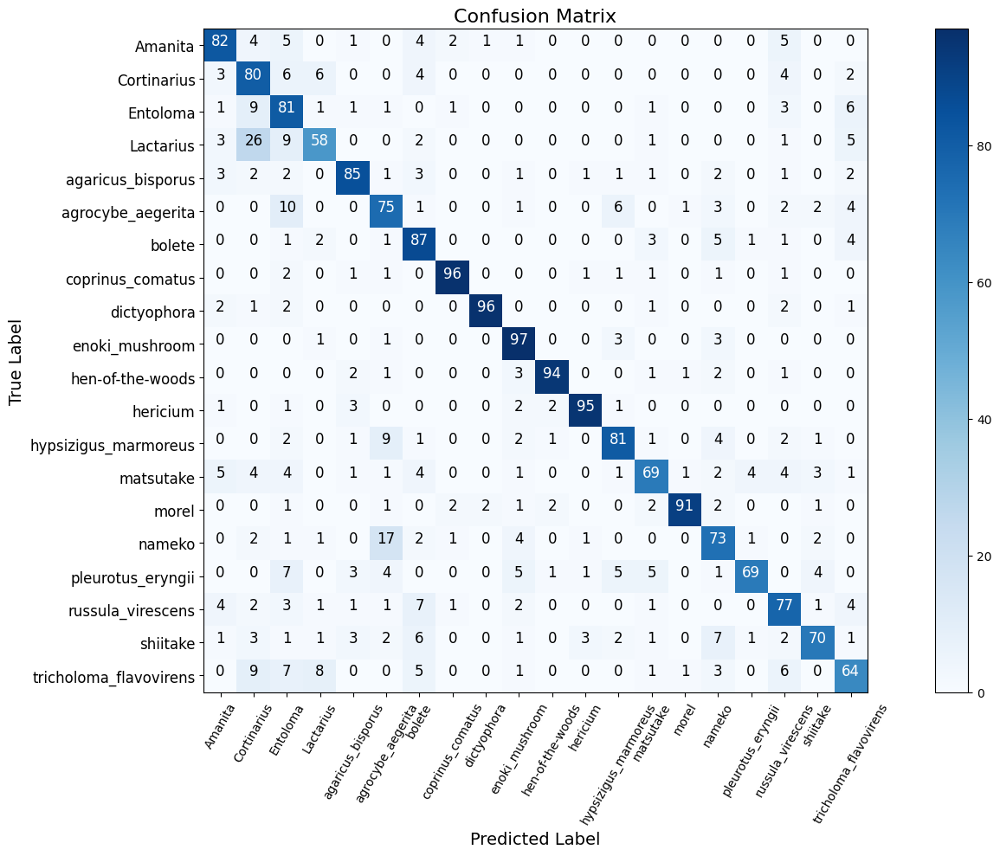

In [ ]:
model_path = dataset + "/evaluation/wo_image_processing/xception.h5"
history_path = dataset + "/evaluation/wo_image_processing/xception_training_log.csv"
evaluate_model(model_path, history_path, test_generator)

### **KNN**

In [ ]:
model_path = dataset + "/evaluation/wo_image_processing/knn_model.pkl"
evaluate_validation_with_generator(model_path, test_generator)

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:318: UserWarning: Trying to unpickle estimator KNeighborsClassifier from version 1.4.1.post1 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/PIL/Image.py:996: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Accuracy: 0.12476190476190477
Classification Report:
              precision    recall  f1-score   support

           0       0.08      0.10      0.09       105
           1       0.00      0.00      0.00       105
           2       0.10      0.56      0.16       105
           3       0.05      0.04      0.04       105
           4       0.14      0.15      0.14       105
           5       0.17      0.07      0.10       105
           6       0.09      0.07      0.07       105
           7       0.25      0.26      0.26       105
           8       0.22      0.10      0.13       105
           9       0.13      0.44      0.21       105
          10       0.11      0.06      0.08       105
          11       0.12      0.18      0.14       105
          12       0.27      0.11      0.16       105
          13       0.20      0.01      0.02       105
          14       0.00      0.00      0.00       105
          15       0.47      0.08      0.13       105
          16       0.10     

### **Random Forest**

In [ ]:
model_path = dataset + "/evaluation/wo_image_processing/rf.pkl"
evaluate_validation_with_generator(model_path, test_generator)

ValueError: node array from the pickle has an incompatible dtype:
- expected: [('left_child', '<i8'), ('right_child', '<i8'), ('feature', '<i8'), ('threshold', '<f8'), ('impurity', '<f8'), ('n_node_samples', '<i8'), ('weighted_n_node_samples', '<f8')]
- got     : {'names': ['left_child', 'right_child', 'feature', 'threshold', 'impurity', 'n_node_samples', 'weighted_n_node_samples', 'missing_go_to_left'], 'formats': ['<i8', '<i8', '<i8', '<f8', '<f8', '<i8', '<f8', 'u1'], 'offsets': [0, 8, 16, 24, 32, 40, 48, 56], 'itemsize': 64}

## **Model Without Augmentation**

### **VGG16**

43/66 [==================>...........] - ETA: 9:21 - loss: 1.3792 - accuracy: 0.6170

/usr/local/lib/python3.10/dist-packages/PIL/Image.py:996: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


66/66 [==============================] - 1462s 22s/step - loss: 1.3670 - accuracy: 0.6176
Test Loss: 1.3669788837432861
Test Accuracy: 0.6176190376281738


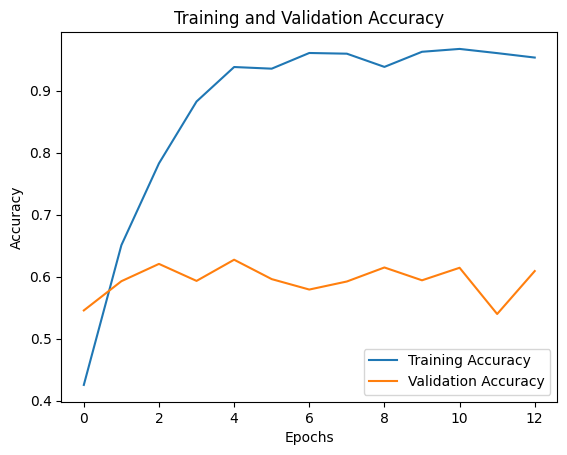

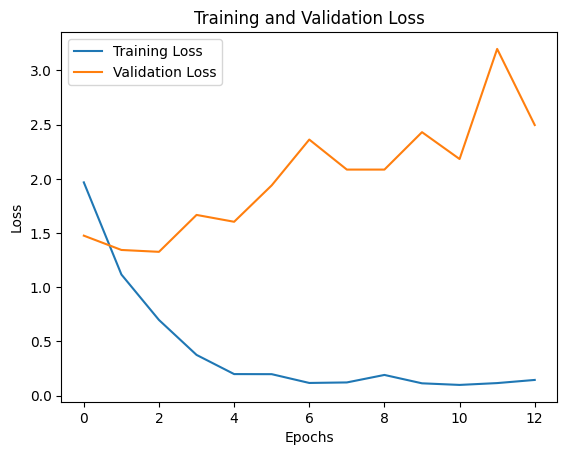

66/66 [==============================] - 1186s 18s/step
Classification Report:
                        precision    recall  f1-score   support

               Amanita       0.73      0.59      0.65       105
           Cortinarius       0.46      0.63      0.53       105
              Entoloma       0.60      0.50      0.54       105
             Lactarius       0.69      0.34      0.46       105
     agaricus_bisporus       0.71      0.70      0.71       105
     agrocybe_aegerita       0.67      0.58      0.62       105
                bolete       0.78      0.41      0.54       105
      coprinus_comatus       0.59      0.88      0.70       105
           dictyophora       0.92      0.55      0.69       105
        enoki_mushroom       0.40      0.90      0.55       105
      hen-of-the-woods       0.89      0.62      0.73       105
              hericium       0.84      0.72      0.78       105
  hypsizigus_marmoreus       0.59      0.58      0.59       105
             matsutake  

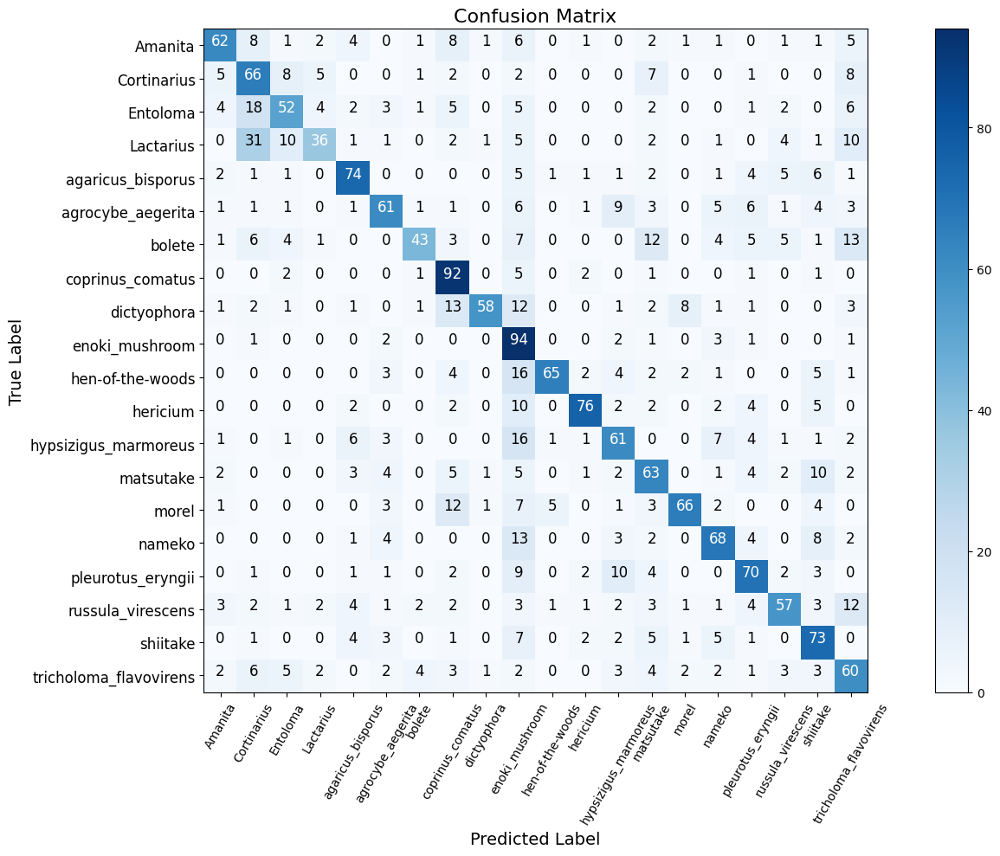

In [ ]:
model_path = dataset + "/evaluation/without_anything/vgg16.h5"
history_path = dataset + "/evaluation/without_anything/vgg16_training_log.csv"
evaluate_model(model_path, history_path, test_generator)

### **ResNet**

43/66 [==================>...........] - ETA: 2:26 - loss: 2.4461 - accuracy: 0.2849

/usr/local/lib/python3.10/dist-packages/PIL/Image.py:996: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


66/66 [==============================] - 417s 6s/step - loss: 2.4793 - accuracy: 0.2690
Test Loss: 2.4793145656585693
Test Accuracy: 0.2690476179122925


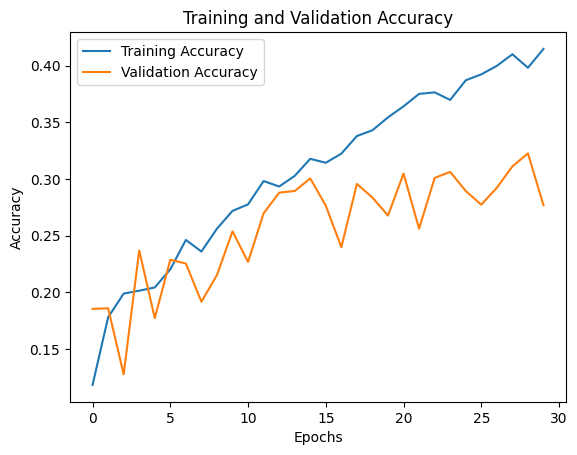

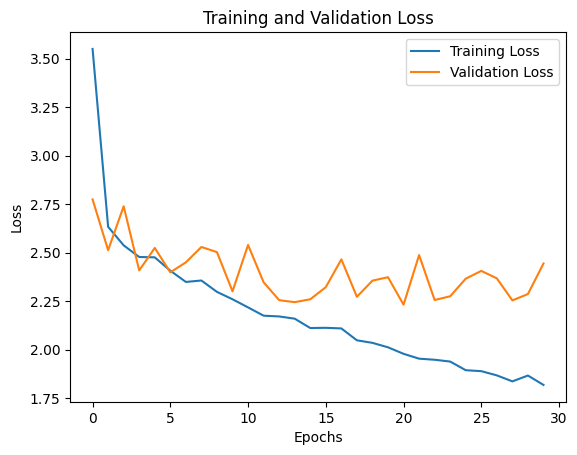

66/66 [==============================] - 447s 7s/step
Classification Report:
                        precision    recall  f1-score   support

               Amanita       0.29      0.04      0.07       105
           Cortinarius       0.44      0.08      0.13       105
              Entoloma       0.11      0.08      0.09       105
             Lactarius       0.38      0.06      0.10       105
     agaricus_bisporus       0.58      0.21      0.31       105
     agrocybe_aegerita       0.25      0.39      0.30       105
                bolete       0.18      0.48      0.26       105
      coprinus_comatus       0.43      0.43      0.43       105
           dictyophora       0.26      0.27      0.26       105
        enoki_mushroom       0.22      0.63      0.33       105
      hen-of-the-woods       0.43      0.37      0.40       105
              hericium       0.58      0.29      0.38       105
  hypsizigus_marmoreus       0.22      0.41      0.29       105
             matsutake    

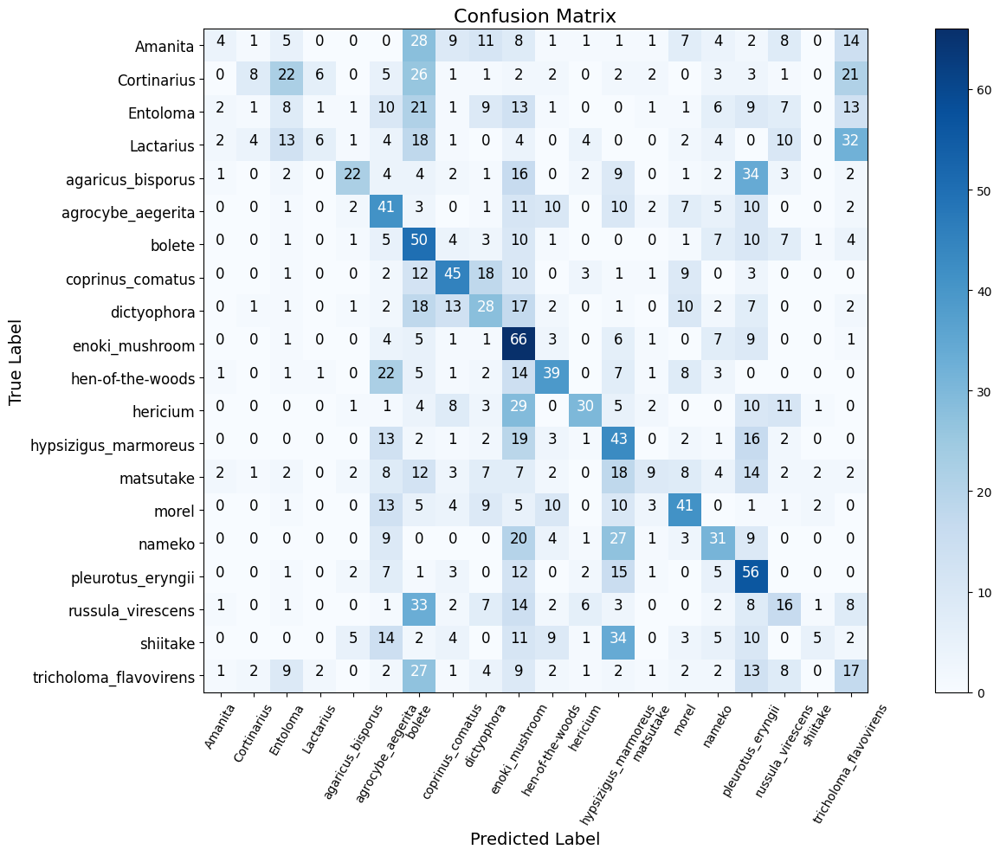

In [ ]:
model_path = dataset + "/evaluation/without_anything/resNet.h5"
history_path = dataset + "/evaluation/without_anything/resNet_training_log.csv"
evaluate_model(model_path, history_path, test_generator)

### **DenseNet**

44/66 [===================>..........] - ETA: 5:25 - loss: 0.5945 - accuracy: 0.8189

/usr/local/lib/python3.10/dist-packages/PIL/Image.py:996: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


66/66 [==============================] - 939s 14s/step - loss: 0.6600 - accuracy: 0.8052
Test Loss: 0.6599879264831543
Test Accuracy: 0.8052380681037903


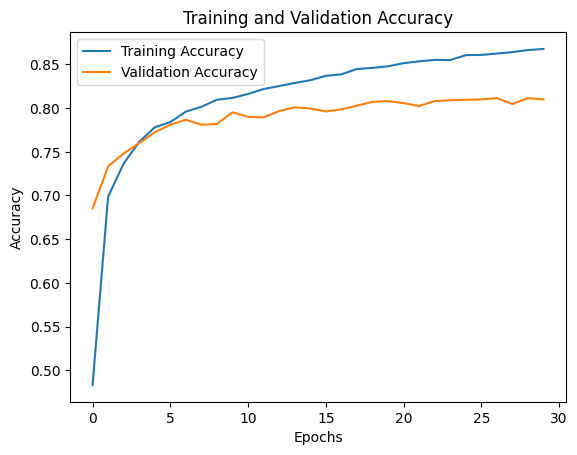

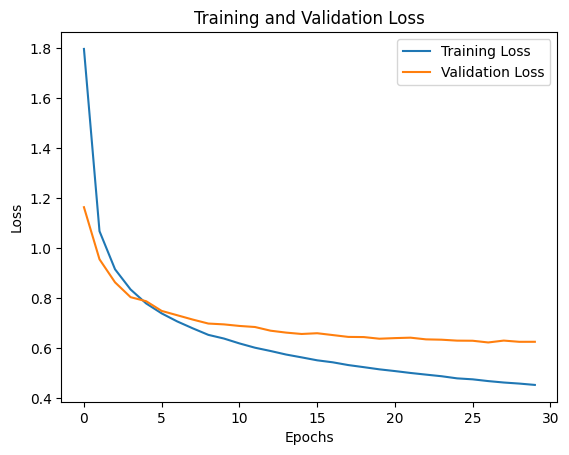

66/66 [==============================] - 421s 6s/step
Classification Report:
                        precision    recall  f1-score   support

               Amanita       0.81      0.88      0.84       105
           Cortinarius       0.68      0.75      0.71       105
              Entoloma       0.77      0.70      0.73       105
             Lactarius       0.71      0.70      0.70       105
     agaricus_bisporus       0.71      0.86      0.78       105
     agrocybe_aegerita       0.79      0.76      0.78       105
                bolete       0.82      0.75      0.79       105
      coprinus_comatus       0.92      0.93      0.92       105
           dictyophora       0.92      0.93      0.93       105
        enoki_mushroom       0.80      0.90      0.85       105
      hen-of-the-woods       0.89      0.89      0.89       105
              hericium       0.91      0.89      0.90       105
  hypsizigus_marmoreus       0.79      0.79      0.79       105
             matsutake    

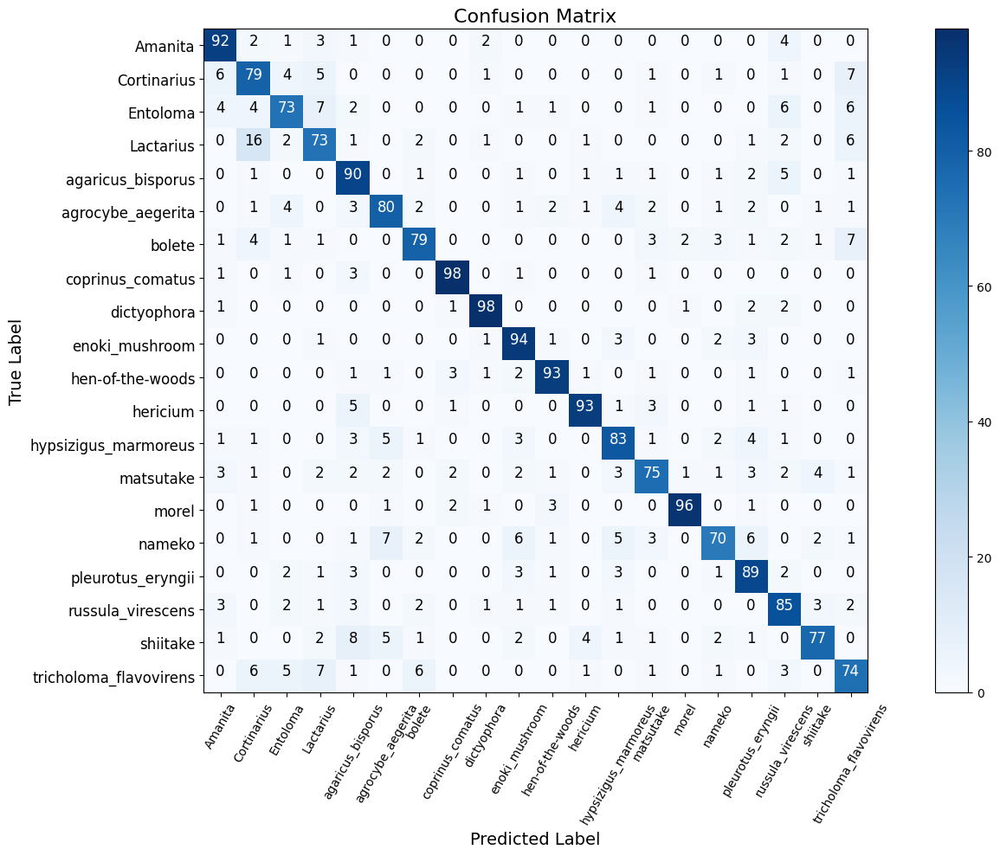

In [ ]:
model_path = dataset + "/evaluation/without_anything/denseNet.h5"
history_path = dataset + "/evaluation/without_anything/denseNet_training_log.csv"
evaluate_model(model_path, history_path, test_generator)

### **GoogLeNet (Inception)**

43/66 [==================>...........] - ETA: 2:08 - loss: 0.0637 - accuracy: 0.7718

/usr/local/lib/python3.10/dist-packages/PIL/Image.py:996: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


66/66 [==============================] - 345s 5s/step - loss: 0.0726 - accuracy: 0.7424
Test Loss: 0.0725628212094307
Test Accuracy: 0.7423809766769409


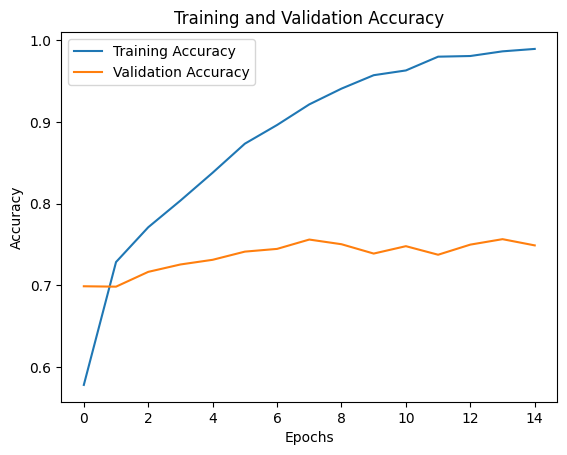

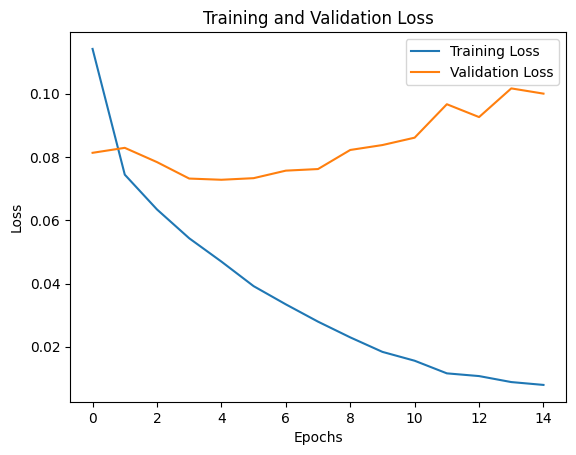

66/66 [==============================] - 281s 4s/step
Classification Report:
                        precision    recall  f1-score   support

               Amanita       0.88      0.55      0.68       105
           Cortinarius       0.56      0.78      0.65       105
              Entoloma       0.62      0.68      0.65       105
             Lactarius       0.83      0.46      0.59       105
     agaricus_bisporus       0.65      0.78      0.71       105
     agrocybe_aegerita       0.60      0.79      0.68       105
                bolete       0.77      0.74      0.76       105
      coprinus_comatus       0.80      0.93      0.86       105
           dictyophora       0.76      0.91      0.83       105
        enoki_mushroom       0.87      0.92      0.89       105
      hen-of-the-woods       0.83      0.88      0.85       105
              hericium       0.93      0.81      0.87       105
  hypsizigus_marmoreus       0.70      0.79      0.74       105
             matsutake    

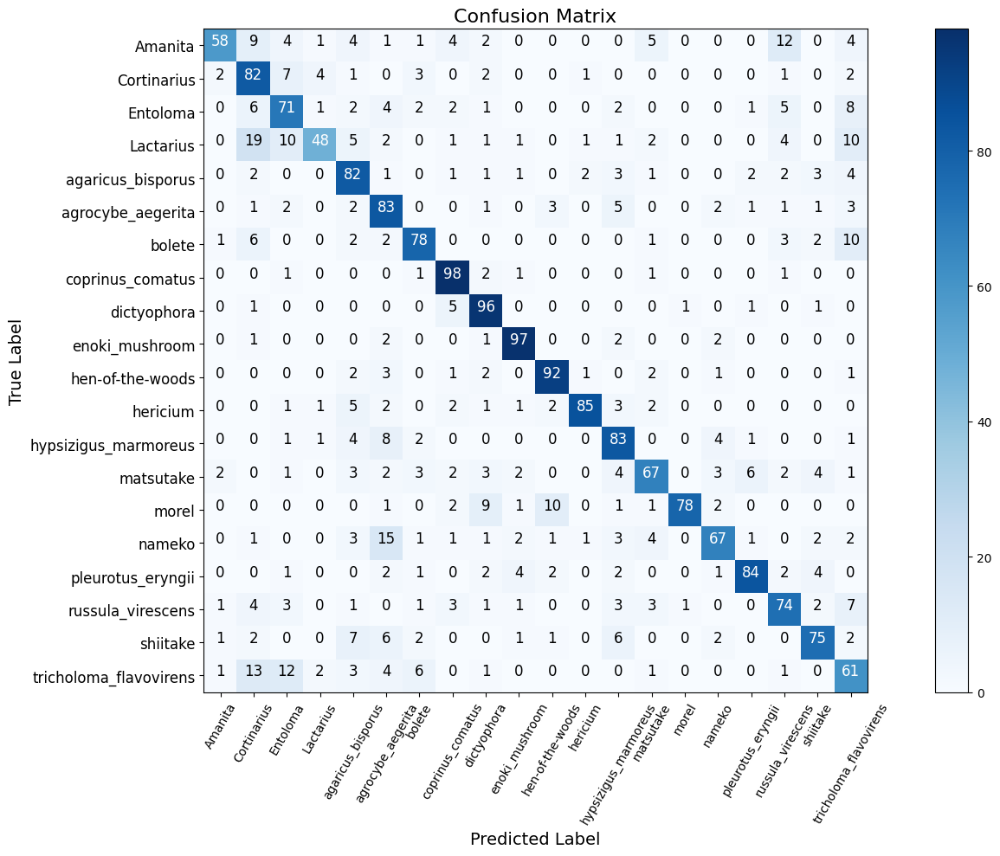

In [ ]:
model_path = dataset + "/evaluation/without_anything/inception.h5"
history_path = dataset + "/evaluation/without_anything/inception_training_log.csv"
evaluate_model(model_path, history_path, test_generator)

### **MobileNet**

43/66 [==================>...........] - ETA: 42s - loss: 0.0543 - accuracy: 0.8154

/usr/local/lib/python3.10/dist-packages/PIL/Image.py:996: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


66/66 [==============================] - 122s 2s/step - loss: 0.0565 - accuracy: 0.8129
Test Loss: 0.056543979793787
Test Accuracy: 0.8128571510314941


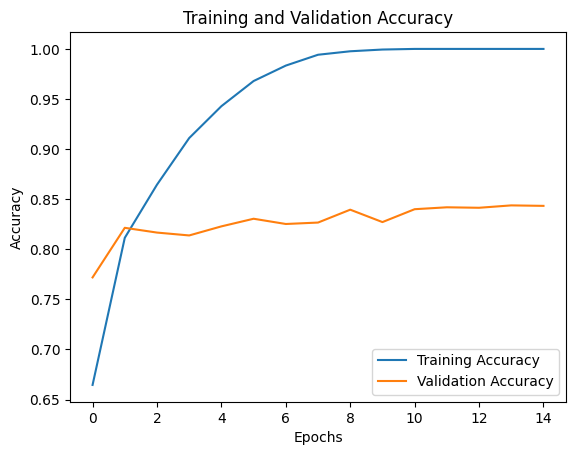

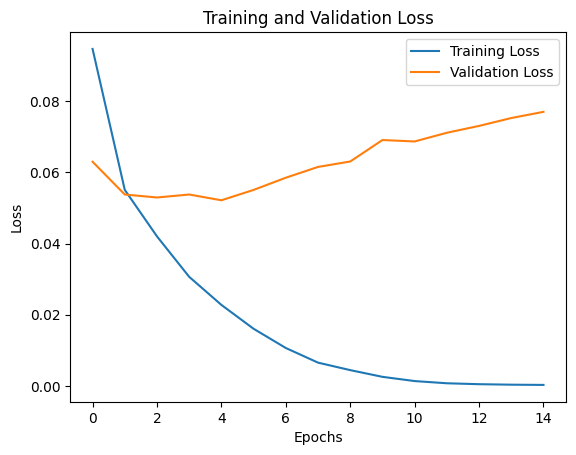

66/66 [==============================] - 119s 2s/step
Classification Report:
                        precision    recall  f1-score   support

               Amanita       0.83      0.82      0.83       105
           Cortinarius       0.66      0.83      0.74       105
              Entoloma       0.85      0.59      0.70       105
             Lactarius       0.70      0.72      0.71       105
     agaricus_bisporus       0.85      0.78      0.81       105
     agrocybe_aegerita       0.82      0.71      0.77       105
                bolete       0.80      0.82      0.81       105
      coprinus_comatus       0.99      0.93      0.96       105
           dictyophora       0.92      0.84      0.88       105
        enoki_mushroom       0.80      0.92      0.86       105
      hen-of-the-woods       0.82      0.94      0.88       105
              hericium       0.91      0.93      0.92       105
  hypsizigus_marmoreus       0.82      0.74      0.78       105
             matsutake    

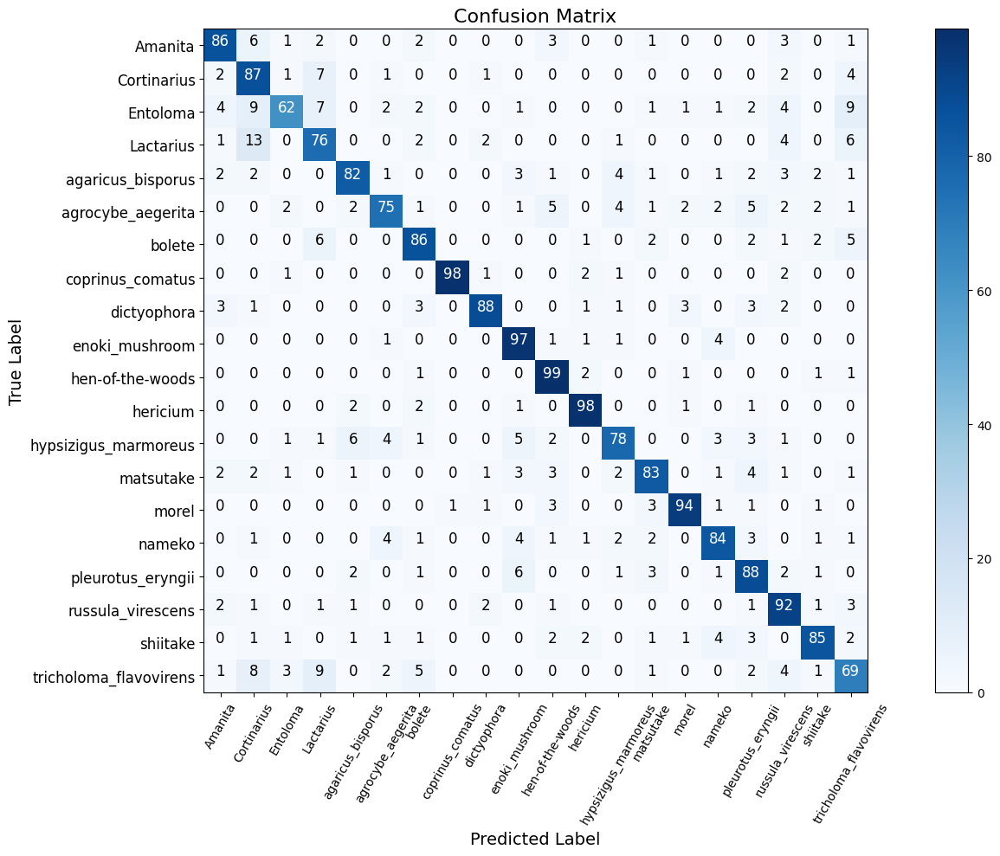

In [ ]:
model_path = dataset + "/evaluation/without_anything/mobilenet.h5"
history_path = dataset + "/evaluation/without_anything/mobileNet_training_log.csv"
evaluate_model(model_path, history_path, test_generator)

### **Xception**

43/66 [==================>...........] - ETA: 3:00 - loss: 0.0640 - accuracy: 0.7616

/usr/local/lib/python3.10/dist-packages/PIL/Image.py:996: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


66/66 [==============================] - 513s 8s/step - loss: 0.0676 - accuracy: 0.7500
Test Loss: 0.06755688041448593
Test Accuracy: 0.75


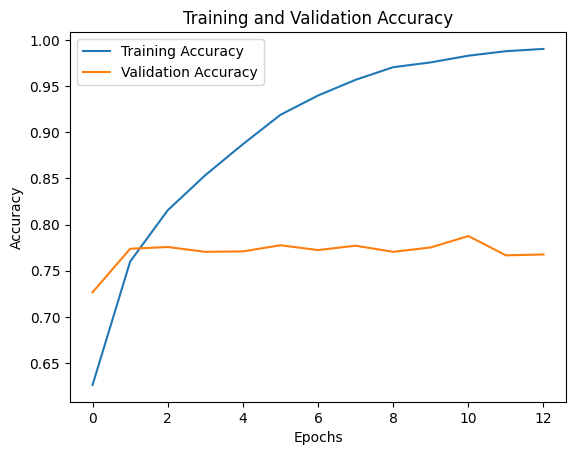

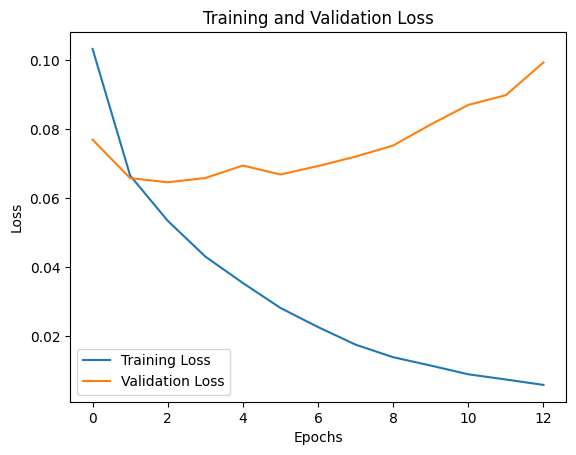

66/66 [==============================] - 504s 8s/step
Classification Report:
                        precision    recall  f1-score   support

               Amanita       0.65      0.78      0.71       105
           Cortinarius       0.67      0.59      0.63       105
              Entoloma       0.79      0.50      0.62       105
             Lactarius       0.55      0.73      0.63       105
     agaricus_bisporus       0.85      0.69      0.76       105
     agrocybe_aegerita       0.69      0.72      0.71       105
                bolete       0.72      0.77      0.75       105
      coprinus_comatus       0.92      0.90      0.91       105
           dictyophora       0.92      0.92      0.92       105
        enoki_mushroom       0.87      0.90      0.89       105
      hen-of-the-woods       0.74      0.93      0.82       105
              hericium       0.91      0.88      0.89       105
  hypsizigus_marmoreus       0.81      0.59      0.68       105
             matsutake    

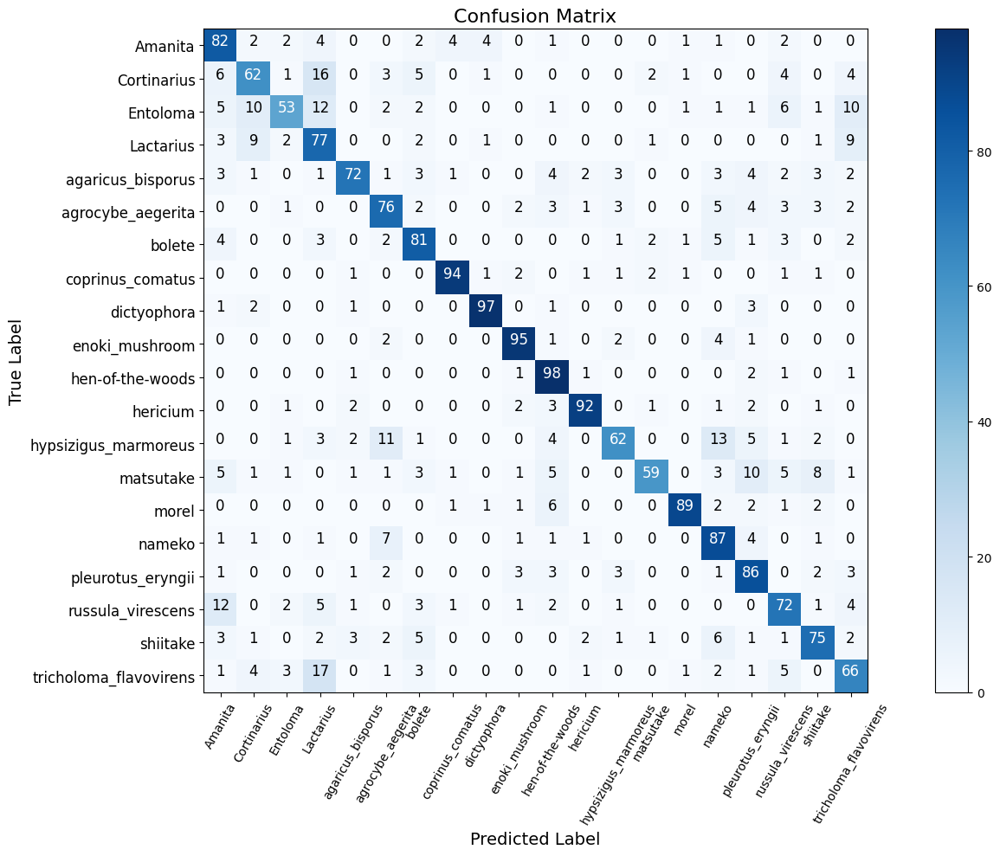

In [ ]:
model_path = dataset + "/evaluation/without_anything/xception.h5"
history_path = dataset + "/evaluation/without_anything/xception_training_log.csv"
evaluate_model(model_path, history_path, test_generator)

## **Model With Augmentation and Bluring**

### **VGG16**

43/66 [==================>...........] - ETA: 7:57 - loss: 1.2747 - accuracy: 0.6047

/usr/local/lib/python3.10/dist-packages/PIL/Image.py:996: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


66/66 [==============================] - 1357s 21s/step - loss: 1.4238 - accuracy: 0.5695
Test Loss: 1.4237936735153198
Test Accuracy: 0.569523811340332


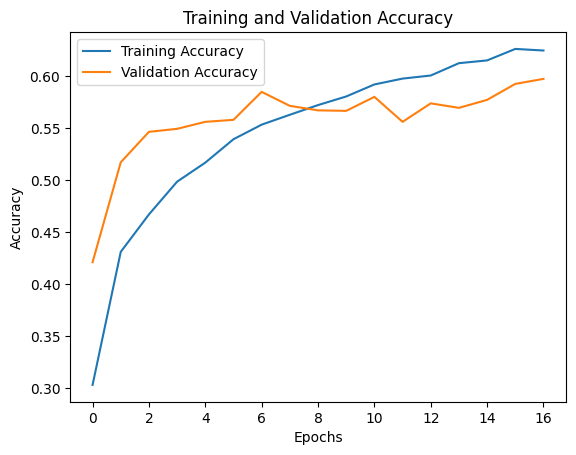

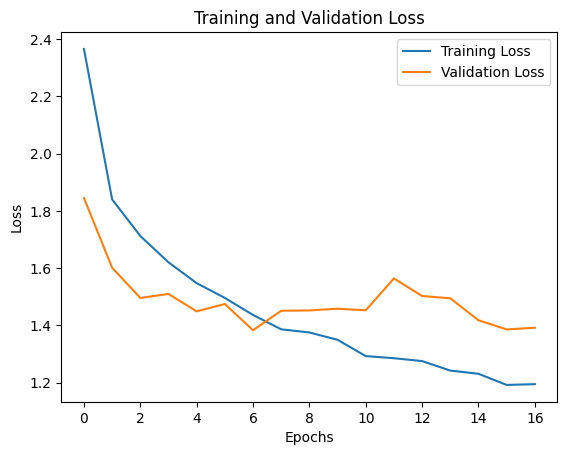

66/66 [==============================] - 1361s 21s/step
Classification Report:
                        precision    recall  f1-score   support

               Amanita       0.44      0.60      0.51       105
           Cortinarius       0.45      0.48      0.46       105
              Entoloma       0.46      0.53      0.49       105
             Lactarius       0.36      0.45      0.40       105
     agaricus_bisporus       0.82      0.57      0.67       105
     agrocybe_aegerita       0.47      0.57      0.52       105
                bolete       0.55      0.55      0.55       105
      coprinus_comatus       0.76      0.62      0.68       105
           dictyophora       0.51      0.81      0.62       105
        enoki_mushroom       0.66      0.72      0.69       105
      hen-of-the-woods       0.84      0.58      0.69       105
              hericium       0.71      0.78      0.74       105
  hypsizigus_marmoreus       0.48      0.64      0.55       105
             matsutake  

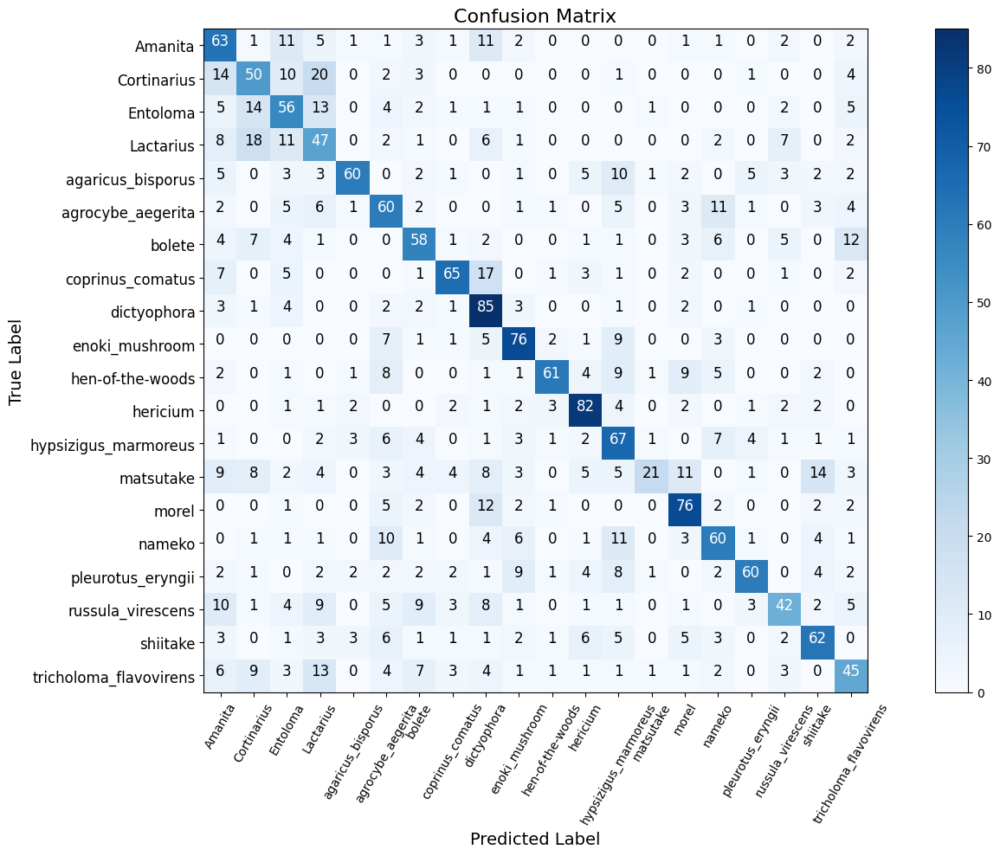

In [ ]:
model_path = dataset + "/evaluation/with_image_processing/vgg16.h5"
history_path = dataset + "/evaluation/with_image_processing/vgg16_training_log.csv"
evaluate_model(model_path, history_path, test_generator)

### **ResNet**

43/66 [==================>...........] - ETA: 2:47 - loss: 2.9832 - accuracy: 0.0814

/usr/local/lib/python3.10/dist-packages/PIL/Image.py:996: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


66/66 [==============================] - 478s 7s/step - loss: 2.9250 - accuracy: 0.0862
Test Loss: 2.925034999847412
Test Accuracy: 0.08619047701358795


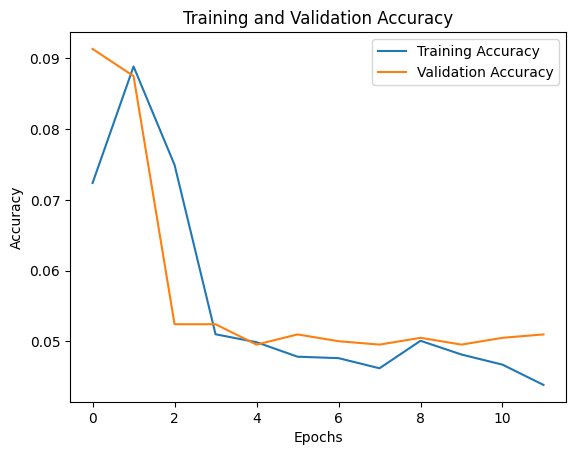

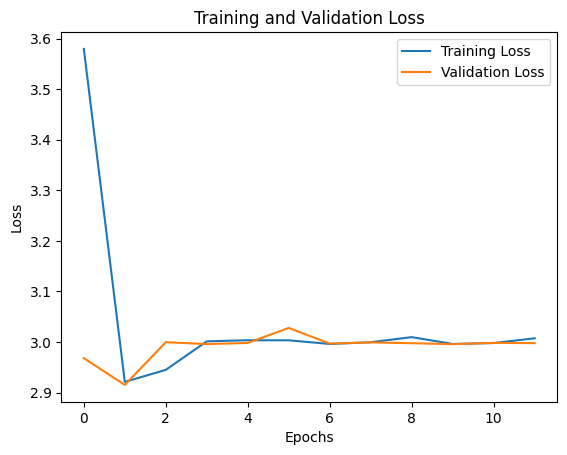

66/66 [==============================] - 483s 7s/step
Classification Report:
                        precision    recall  f1-score   support

               Amanita       0.05      0.01      0.02       105
           Cortinarius       0.00      0.00      0.00       105
              Entoloma       0.00      0.00      0.00       105
             Lactarius       0.00      0.00      0.00       105
     agaricus_bisporus       0.12      0.17      0.14       105
     agrocybe_aegerita       0.08      0.45      0.14       105
                bolete       0.00      0.00      0.00       105
      coprinus_comatus       0.20      0.01      0.02       105
           dictyophora       0.08      0.04      0.05       105
        enoki_mushroom       0.12      0.19      0.15       105
      hen-of-the-woods       0.04      0.11      0.06       105
              hericium       0.39      0.09      0.14       105
  hypsizigus_marmoreus       0.00      0.00      0.00       105
             matsutake    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


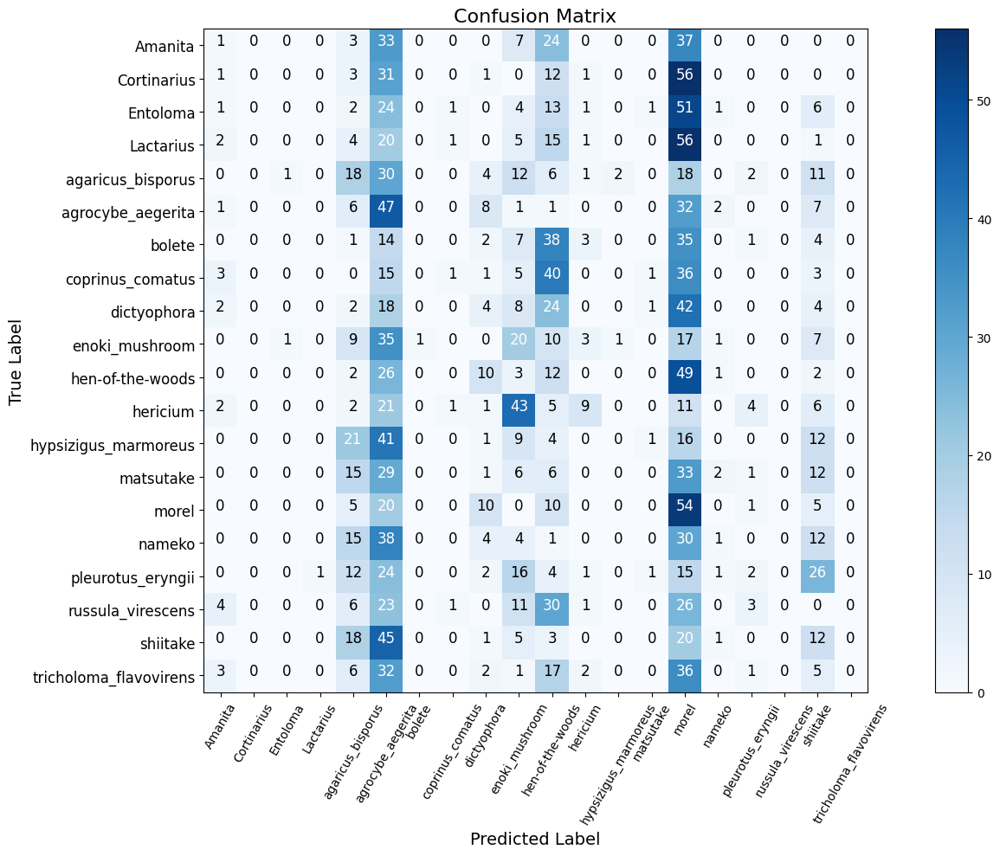

In [ ]:
model_path = dataset + "/evaluation/with_image_processing/resNet.h5"
history_path = dataset + "/evaluation/with_image_processing/resNet_training_log.csv"
evaluate_model(model_path, history_path, test_generator)

### **DenseNet**

43/66 [==================>...........] - ETA: 2:28 - loss: 0.8566 - accuracy: 0.7304

/usr/local/lib/python3.10/dist-packages/PIL/Image.py:996: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


66/66 [==============================] - 422s 6s/step - loss: 0.9343 - accuracy: 0.7210
Test Loss: 0.9342785477638245
Test Accuracy: 0.7209523916244507


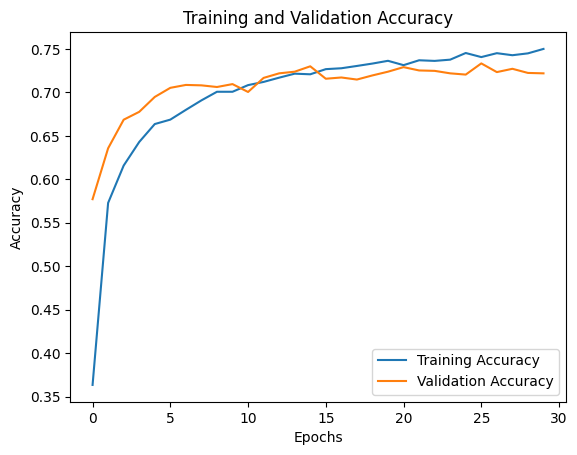

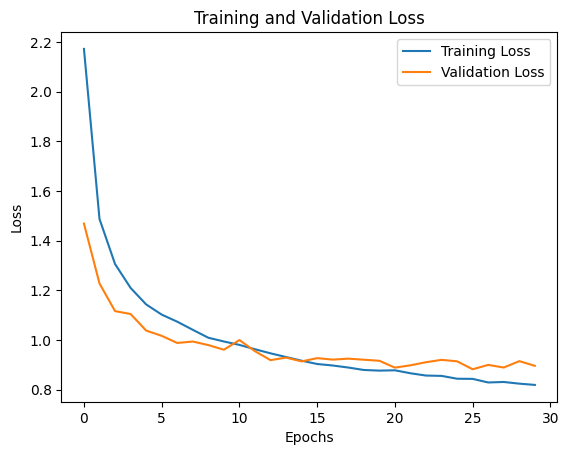

66/66 [==============================] - 401s 6s/step
Classification Report:
                        precision    recall  f1-score   support

               Amanita       0.43      0.90      0.58       105
           Cortinarius       0.63      0.47      0.54       105
              Entoloma       0.70      0.52      0.60       105
             Lactarius       0.64      0.54      0.59       105
     agaricus_bisporus       0.70      0.75      0.72       105
     agrocybe_aegerita       0.68      0.71      0.70       105
                bolete       0.68      0.80      0.74       105
      coprinus_comatus       0.89      0.87      0.88       105
           dictyophora       0.92      0.90      0.91       105
        enoki_mushroom       0.89      0.71      0.79       105
      hen-of-the-woods       0.85      0.84      0.85       105
              hericium       0.91      0.88      0.89       105
  hypsizigus_marmoreus       0.69      0.58      0.63       105
             matsutake    

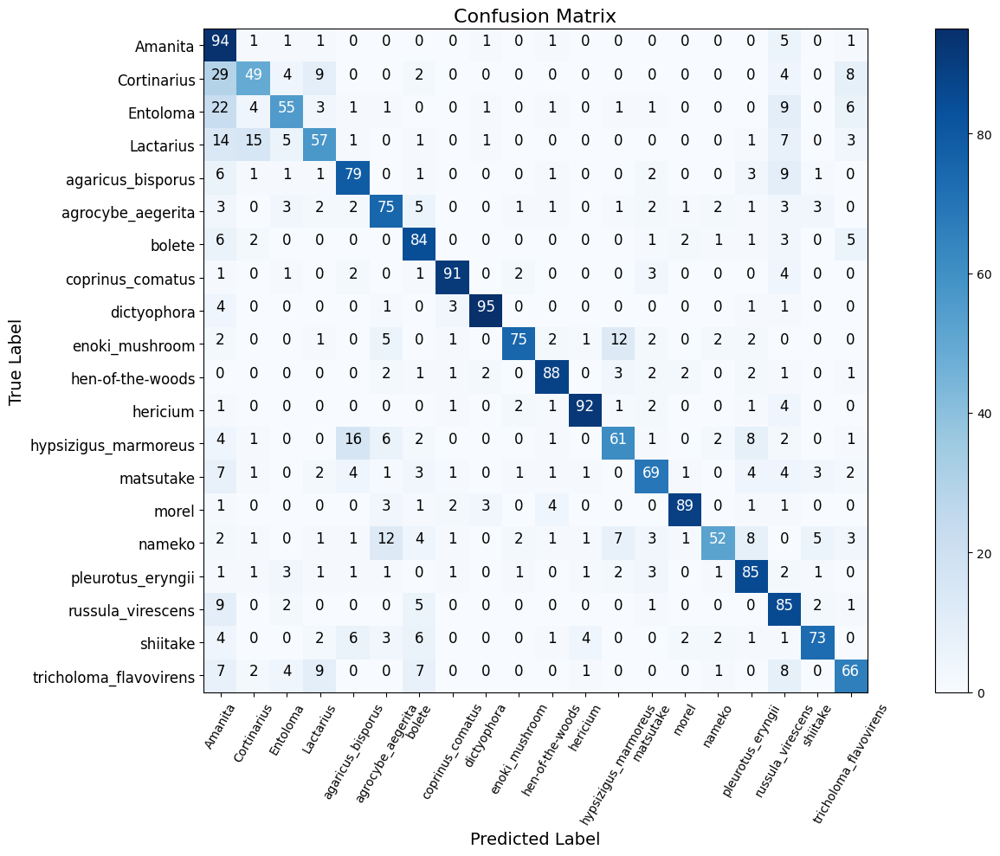

In [ ]:
model_path = dataset + "/evaluation/with_image_processing/denseNet.h5"
history_path = dataset + "/evaluation/with_image_processing/denseNet_training_log.csv"
evaluate_model(model_path, history_path, test_generator)

### **GoogLeNet (Inception)**

43/66 [==================>...........] - ETA: 1:39 - loss: 0.0675 - accuracy: 0.7478

/usr/local/lib/python3.10/dist-packages/PIL/Image.py:996: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


66/66 [==============================] - 284s 4s/step - loss: 0.0733 - accuracy: 0.7305
Test Loss: 0.0732591524720192
Test Accuracy: 0.7304762005805969


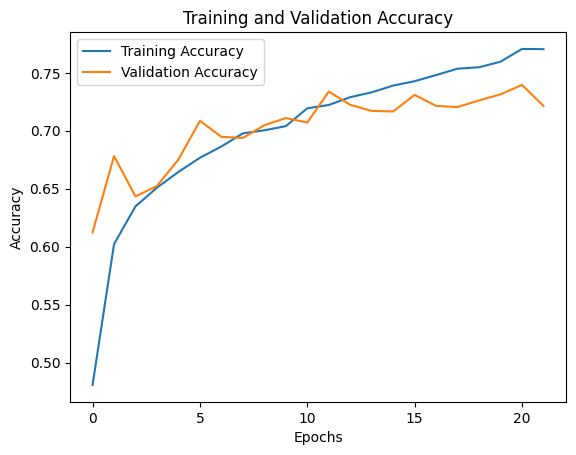

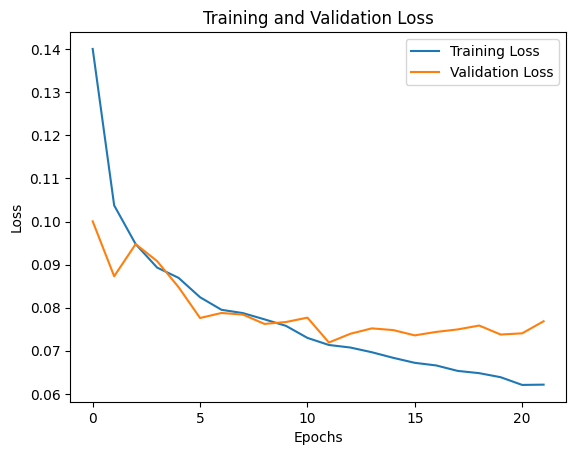

66/66 [==============================] - 278s 4s/step
Classification Report:
                        precision    recall  f1-score   support

               Amanita       0.56      0.79      0.66       105
           Cortinarius       0.50      0.68      0.58       105
              Entoloma       0.65      0.56      0.60       105
             Lactarius       0.57      0.71      0.64       105
     agaricus_bisporus       0.69      0.71      0.70       105
     agrocybe_aegerita       0.70      0.63      0.66       105
                bolete       0.70      0.82      0.75       105
      coprinus_comatus       0.98      0.79      0.87       105
           dictyophora       0.84      0.91      0.88       105
        enoki_mushroom       0.96      0.85      0.90       105
      hen-of-the-woods       0.85      0.82      0.83       105
              hericium       0.83      0.86      0.85       105
  hypsizigus_marmoreus       0.80      0.57      0.67       105
             matsutake    

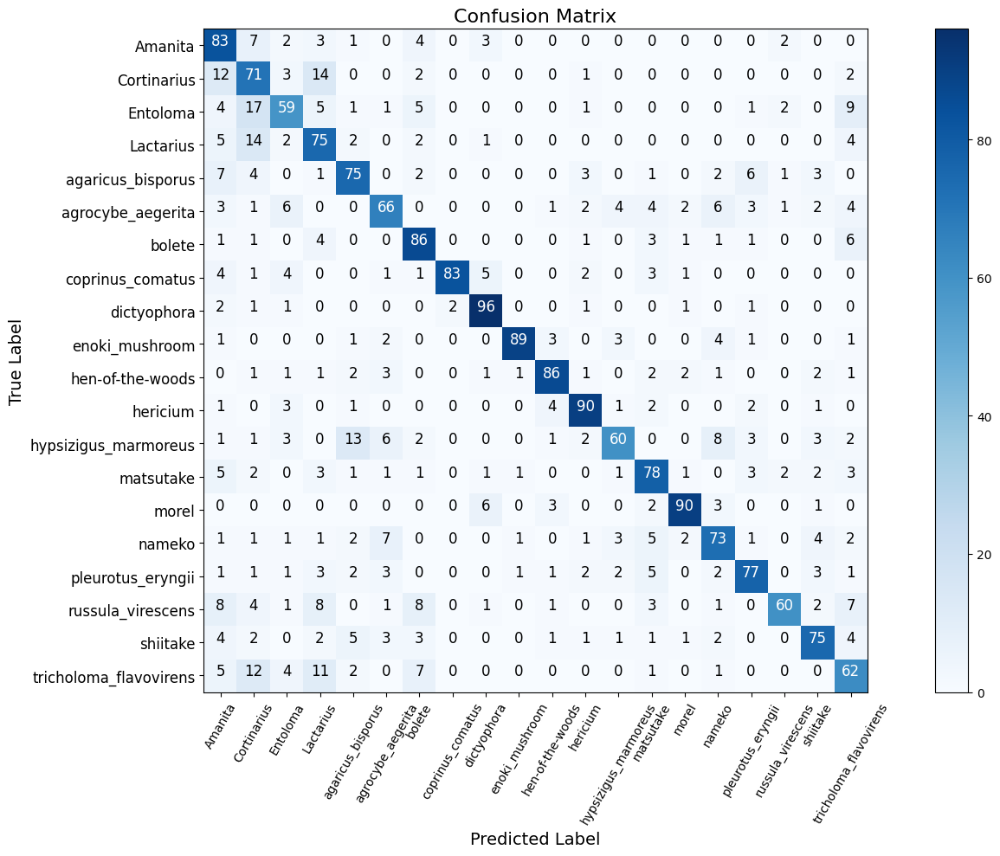

In [ ]:
model_path = dataset + "/evaluation/with_image_processing/inception.h5"
history_path = dataset + "/evaluation/with_image_processing/inception_training_log.csv"
evaluate_model(model_path, history_path, test_generator)

### **MobileNet**

43/66 [==================>...........] - ETA: 39s - loss: 0.0570 - accuracy: 0.8031

/usr/local/lib/python3.10/dist-packages/PIL/Image.py:996: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


66/66 [==============================] - 114s 2s/step - loss: 0.0665 - accuracy: 0.7757
Test Loss: 0.06650847941637039
Test Accuracy: 0.7757142782211304


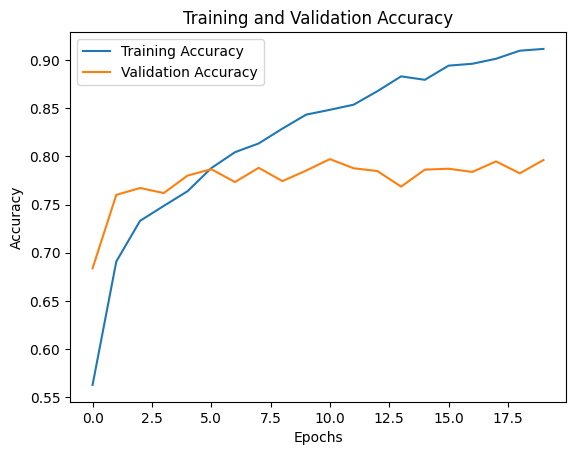

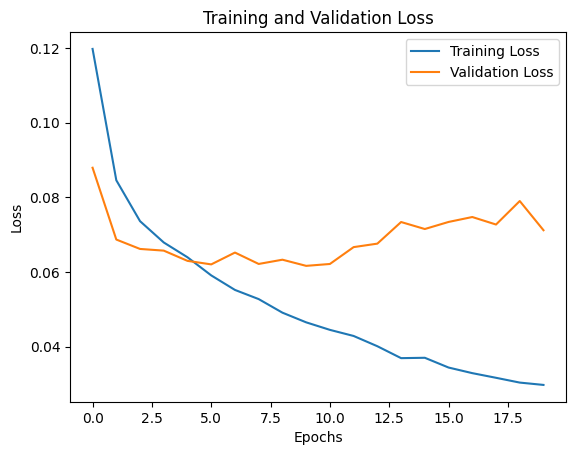

66/66 [==============================] - 130s 2s/step
Classification Report:
                        precision    recall  f1-score   support

               Amanita       0.72      0.84      0.77       105
           Cortinarius       0.68      0.73      0.71       105
              Entoloma       0.54      0.79      0.64       105
             Lactarius       0.59      0.72      0.65       105
     agaricus_bisporus       0.73      0.76      0.74       105
     agrocybe_aegerita       0.84      0.67      0.74       105
                bolete       0.89      0.69      0.77       105
      coprinus_comatus       0.98      0.89      0.93       105
           dictyophora       0.78      0.92      0.85       105
        enoki_mushroom       0.77      0.94      0.85       105
      hen-of-the-woods       0.88      0.87      0.88       105
              hericium       0.96      0.85      0.90       105
  hypsizigus_marmoreus       0.77      0.76      0.77       105
             matsutake    

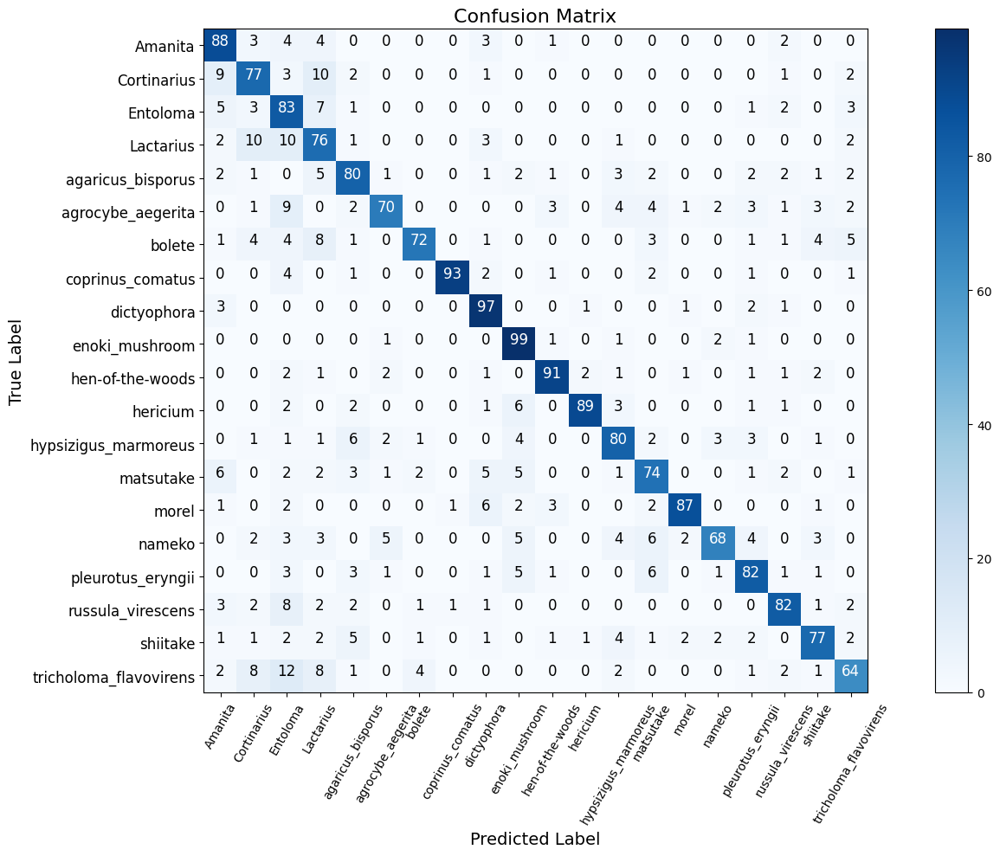

In [ ]:
model_path = dataset + "/evaluation/with_image_processing/mobilenet.h5"
history_path = dataset + "/evaluation/with_image_processing/mobileNet_training_log.csv"
evaluate_model(model_path, history_path, test_generator)

### **Xception**

43/66 [==================>...........] - ETA: 3:40 - loss: 0.0700 - accuracy: 0.7507

/usr/local/lib/python3.10/dist-packages/PIL/Image.py:996: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


66/66 [==============================] - 590s 9s/step - loss: 0.0771 - accuracy: 0.7262
Test Loss: 0.07706591486930847
Test Accuracy: 0.726190447807312


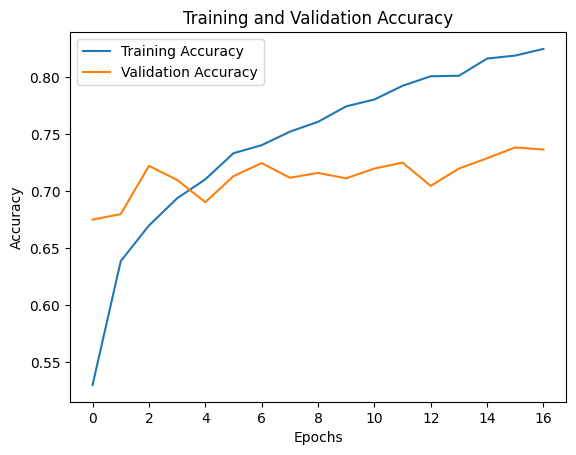

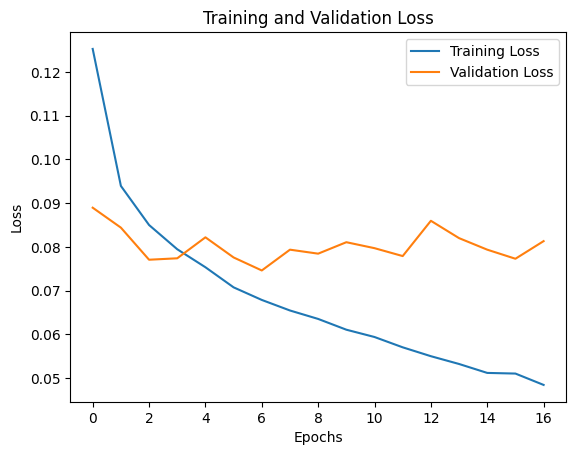

66/66 [==============================] - 524s 8s/step
Classification Report:
                        precision    recall  f1-score   support

               Amanita       0.47      0.89      0.62       105
           Cortinarius       0.68      0.50      0.57       105
              Entoloma       0.77      0.48      0.59       105
             Lactarius       0.58      0.56      0.57       105
     agaricus_bisporus       0.85      0.73      0.79       105
     agrocybe_aegerita       0.62      0.70      0.66       105
                bolete       0.67      0.79      0.73       105
      coprinus_comatus       0.93      0.92      0.93       105
           dictyophora       0.88      0.95      0.92       105
        enoki_mushroom       0.94      0.84      0.88       105
      hen-of-the-woods       0.84      0.92      0.88       105
              hericium       0.94      0.84      0.88       105
  hypsizigus_marmoreus       0.71      0.68      0.69       105
             matsutake    

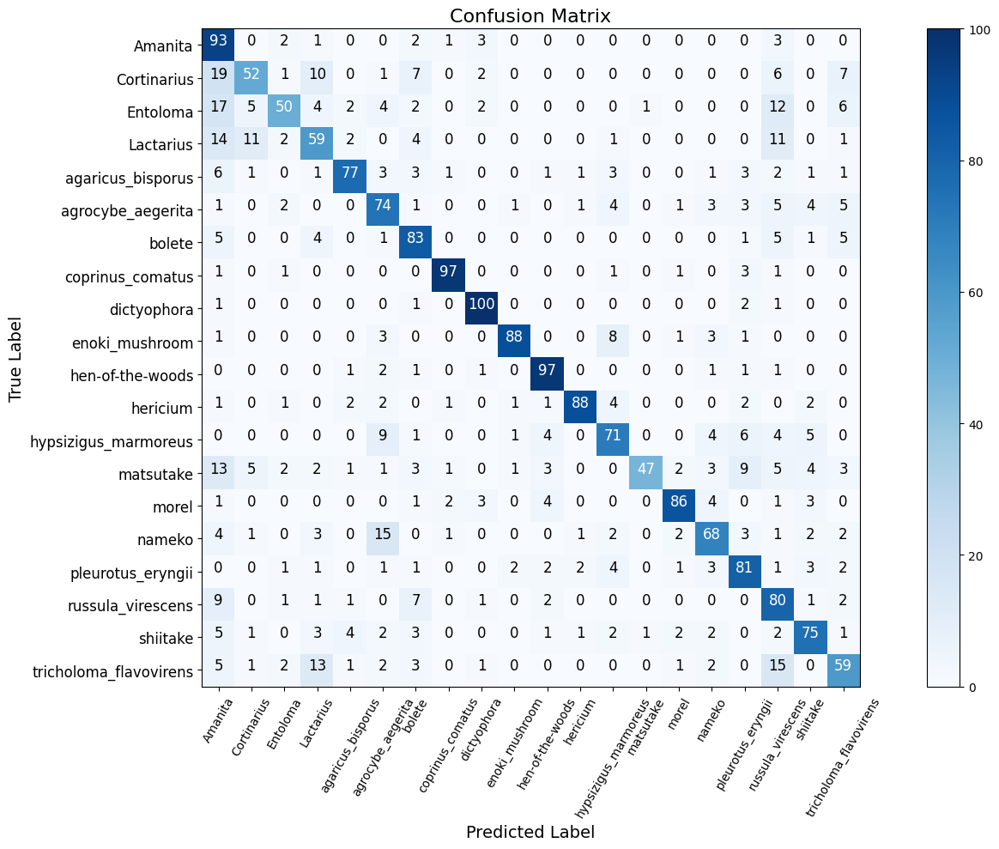

In [ ]:
model_path = dataset + "/evaluation/with_image_processing/xception.h5"
history_path = dataset + "/evaluation/with_image_processing/xception_training_log.csv"
evaluate_model(model_path, history_path, test_generator)

## **Model With Augmentation and Sharpening**

### **VGG16**

42/66 [==================>...........] - ETA: 8:11 - loss: 1.5079 - accuracy: 0.5365

/usr/local/lib/python3.10/dist-packages/PIL/Image.py:996: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


66/66 [==============================] - 1346s 20s/step - loss: 1.5368 - accuracy: 0.5395
Test Loss: 1.536759614944458
Test Accuracy: 0.5395237803459167


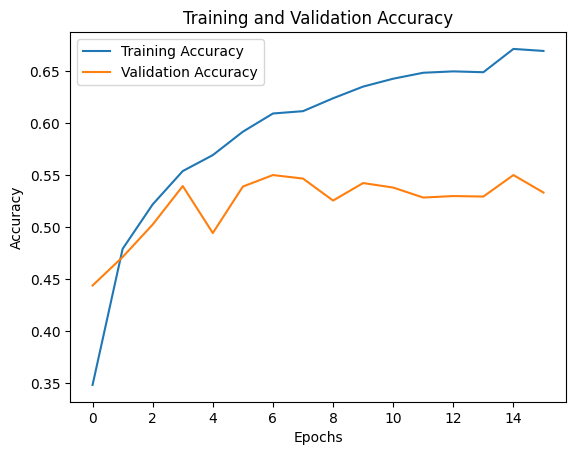

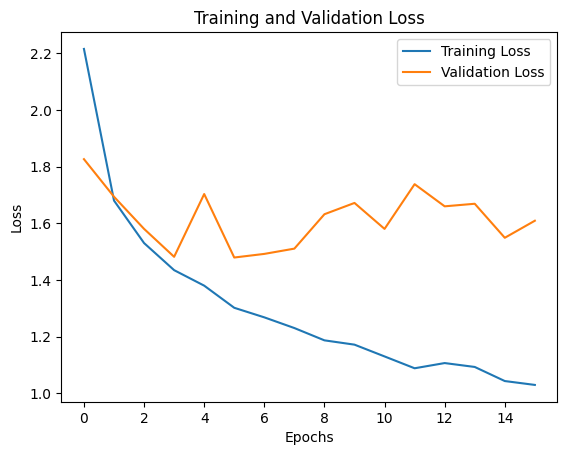

66/66 [==============================] - 1321s 20s/step
Classification Report:
                        precision    recall  f1-score   support

               Amanita       0.39      0.71      0.51       105
           Cortinarius       0.71      0.10      0.17       105
              Entoloma       0.40      0.59      0.48       105
             Lactarius       0.46      0.31      0.37       105
     agaricus_bisporus       0.52      0.74      0.61       105
     agrocybe_aegerita       0.79      0.25      0.38       105
                bolete       0.49      0.54      0.51       105
      coprinus_comatus       0.55      0.83      0.66       105
           dictyophora       0.91      0.46      0.61       105
        enoki_mushroom       0.82      0.59      0.69       105
      hen-of-the-woods       0.74      0.56      0.64       105
              hericium       0.48      0.80      0.60       105
  hypsizigus_marmoreus       0.49      0.50      0.49       105
             matsutake  

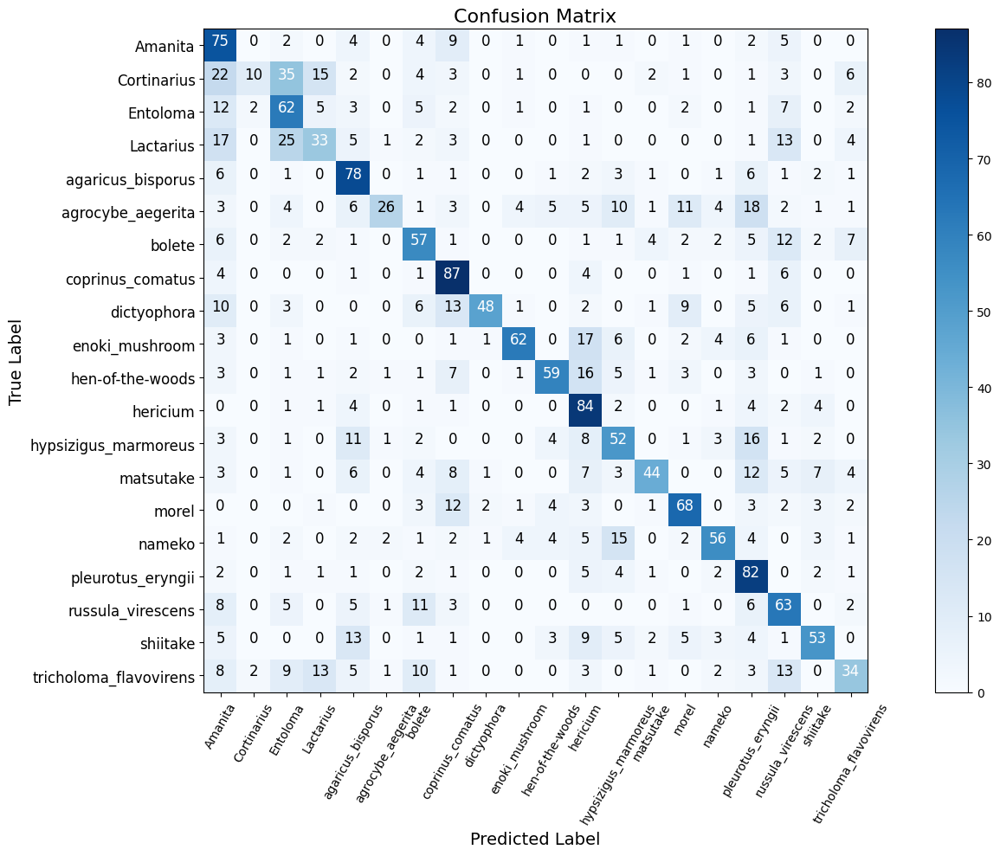

In [ ]:
model_path = dataset + "/evaluation/with_sharpen/vgg16.h5"
history_path = dataset + "/evaluation/with_sharpen/vgg16_training_log.csv"
evaluate_model(model_path, history_path, test_generator)

### **ResNet**

43/66 [==================>...........] - ETA: 2:43 - loss: 2.5393 - accuracy: 0.2071

/usr/local/lib/python3.10/dist-packages/PIL/Image.py:996: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


66/66 [==============================] - 471s 7s/step - loss: 2.5784 - accuracy: 0.1786
Test Loss: 2.5784013271331787
Test Accuracy: 0.1785714328289032


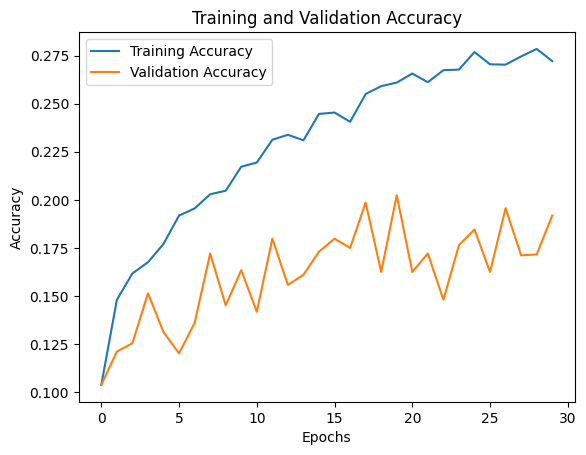

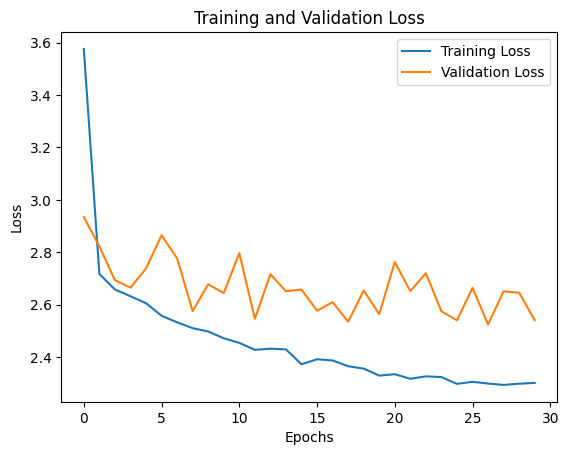

66/66 [==============================] - 485s 7s/step
Classification Report:
                        precision    recall  f1-score   support

               Amanita       0.09      0.03      0.04       105
           Cortinarius       0.28      0.10      0.15       105
              Entoloma       0.00      0.00      0.00       105
             Lactarius       0.18      0.34      0.23       105
     agaricus_bisporus       0.19      0.59      0.29       105
     agrocybe_aegerita       0.20      0.01      0.02       105
                bolete       0.15      0.07      0.09       105
      coprinus_comatus       0.30      0.11      0.17       105
           dictyophora       0.42      0.05      0.09       105
        enoki_mushroom       0.31      0.26      0.28       105
      hen-of-the-woods       0.32      0.27      0.29       105
              hericium       0.11      0.71      0.20       105
  hypsizigus_marmoreus       0.38      0.17      0.24       105
             matsutake    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


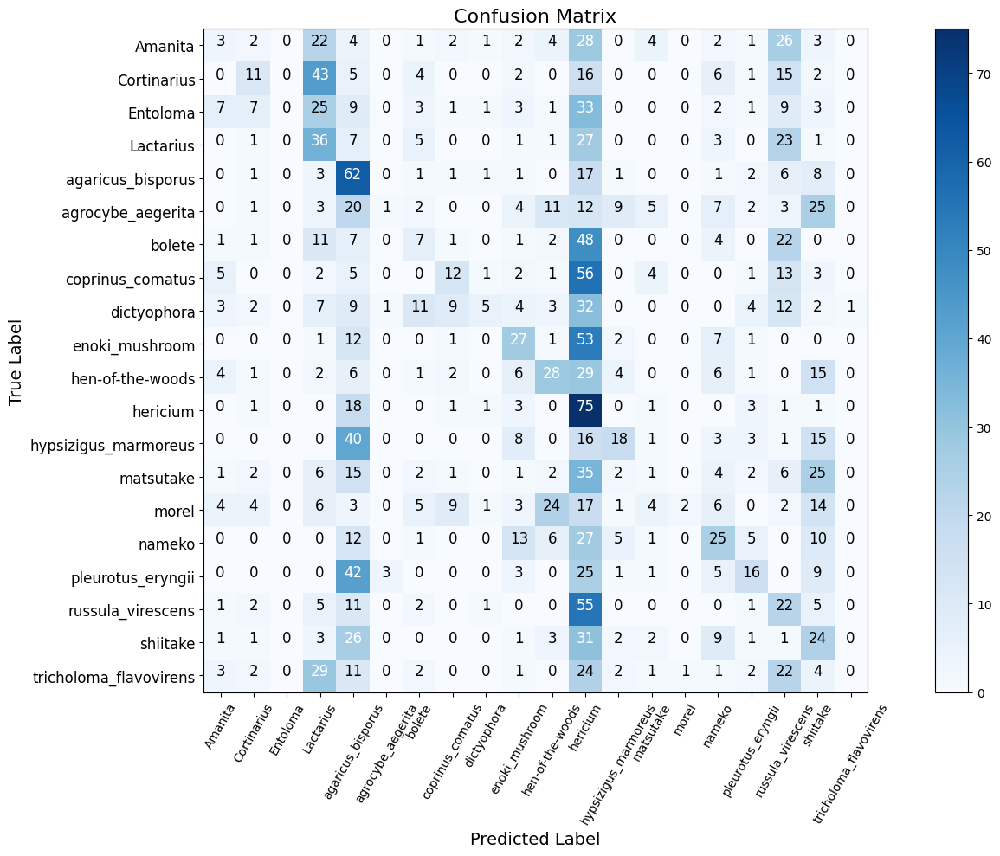

In [ ]:
model_path = dataset + "/evaluation/with_sharpen/resNet.h5"
history_path = dataset + "/evaluation/with_sharpen/resNet_training_log.csv"
evaluate_model(model_path, history_path, test_generator)

### **DenseNet**

43/66 [==================>...........] - ETA: 2:20 - loss: 0.9595 - accuracy: 0.7020

/usr/local/lib/python3.10/dist-packages/PIL/Image.py:996: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


66/66 [==============================] - 405s 6s/step - loss: 0.9777 - accuracy: 0.7029
Test Loss: 0.9777318239212036
Test Accuracy: 0.7028571367263794


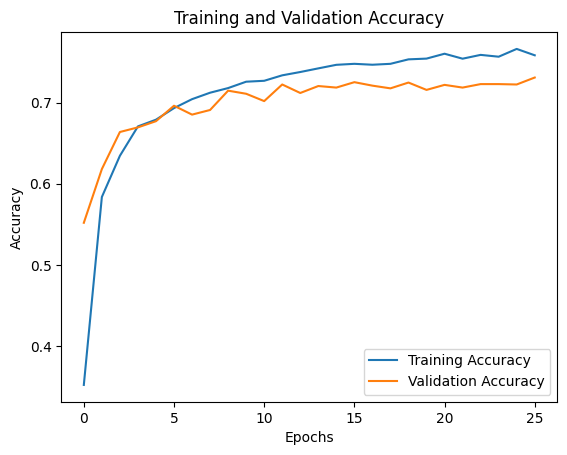

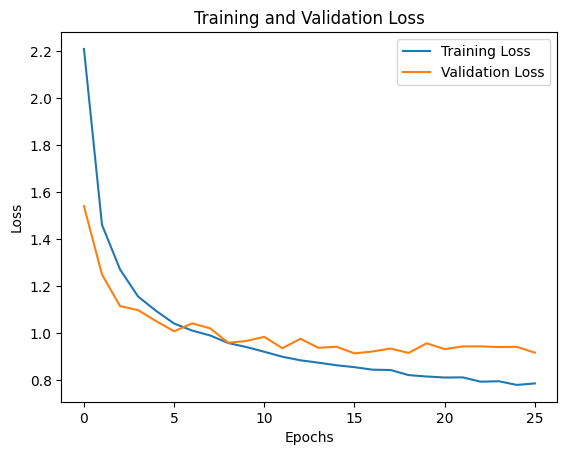

66/66 [==============================] - 418s 6s/step
Classification Report:
                        precision    recall  f1-score   support

               Amanita       0.85      0.61      0.71       105
           Cortinarius       0.75      0.40      0.52       105
              Entoloma       0.53      0.64      0.58       105
             Lactarius       0.61      0.59      0.60       105
     agaricus_bisporus       0.62      0.81      0.71       105
     agrocybe_aegerita       0.88      0.61      0.72       105
                bolete       0.48      0.86      0.62       105
      coprinus_comatus       0.72      0.90      0.80       105
           dictyophora       0.90      0.76      0.82       105
        enoki_mushroom       0.87      0.76      0.81       105
      hen-of-the-woods       0.89      0.70      0.79       105
              hericium       0.81      0.89      0.85       105
  hypsizigus_marmoreus       0.79      0.59      0.68       105
             matsutake    

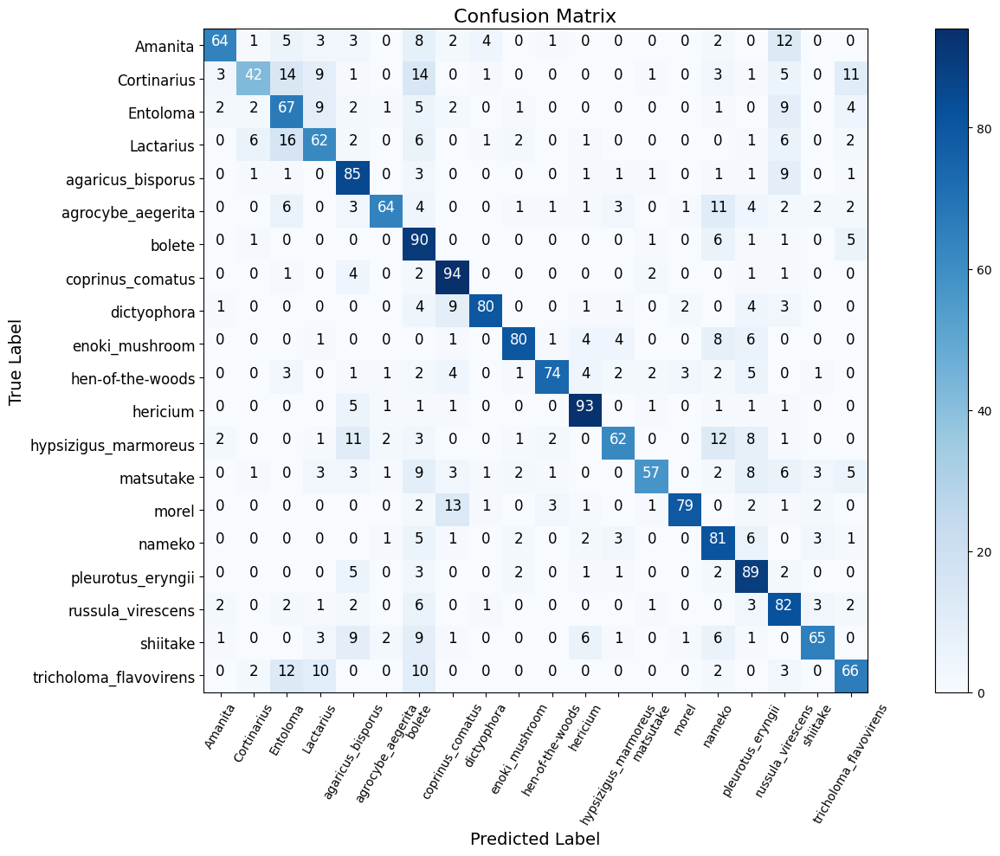

In [ ]:
model_path = dataset + "/evaluation/with_sharpen/denseNet.h5"
history_path = dataset + "/evaluation/with_sharpen/denseNet_training_log.csv"
evaluate_model(model_path, history_path, test_generator)

### **GoogLeNet (Inception)**

43/66 [==================>...........] - ETA: 1:36 - loss: 0.0691 - accuracy: 0.7376

/usr/local/lib/python3.10/dist-packages/PIL/Image.py:996: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


66/66 [==============================] - 275s 4s/step - loss: 0.0737 - accuracy: 0.7305
Test Loss: 0.07365517318248749
Test Accuracy: 0.7304762005805969


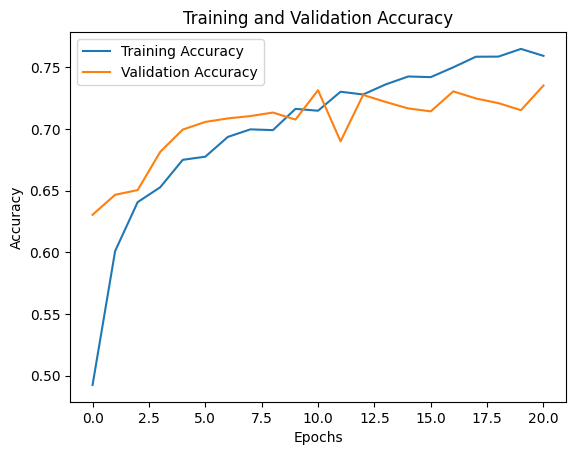

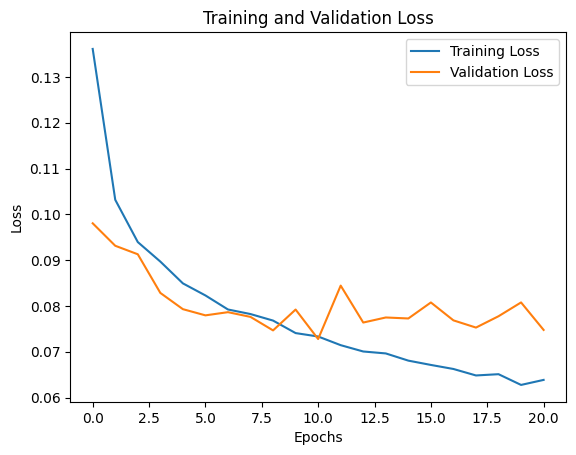

66/66 [==============================] - 281s 4s/step
Classification Report:
                        precision    recall  f1-score   support

               Amanita       0.63      0.79      0.70       105
           Cortinarius       0.71      0.34      0.46       105
              Entoloma       0.49      0.70      0.58       105
             Lactarius       0.88      0.41      0.56       105
     agaricus_bisporus       0.71      0.75      0.73       105
     agrocybe_aegerita       0.55      0.77      0.64       105
                bolete       0.71      0.78      0.74       105
      coprinus_comatus       0.88      0.90      0.89       105
           dictyophora       0.88      0.90      0.89       105
        enoki_mushroom       0.92      0.86      0.89       105
      hen-of-the-woods       0.89      0.81      0.85       105
              hericium       0.89      0.84      0.86       105
  hypsizigus_marmoreus       0.77      0.70      0.74       105
             matsutake    

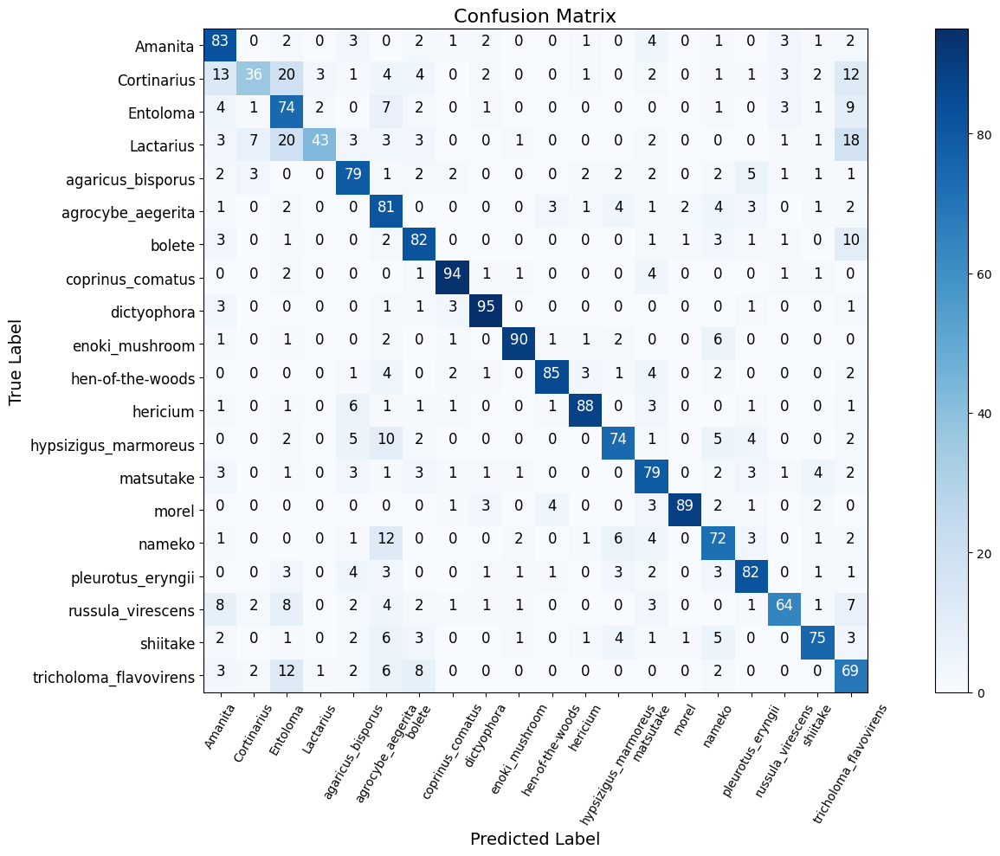

In [ ]:
model_path = dataset + "/evaluation/with_sharpen/inception.h5"
history_path = dataset + "/evaluation/with_sharpen/inception_training_log.csv"
evaluate_model(model_path, history_path, test_generator)

### **MobileNet**

43/66 [==================>...........] - ETA: 39s - loss: 0.0722 - accuracy: 0.7594

/usr/local/lib/python3.10/dist-packages/PIL/Image.py:996: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


66/66 [==============================] - 114s 2s/step - loss: 0.0762 - accuracy: 0.7495
Test Loss: 0.07621026784181595
Test Accuracy: 0.7495238184928894


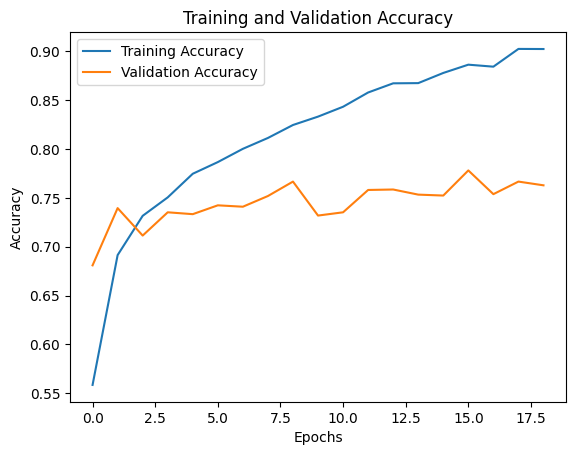

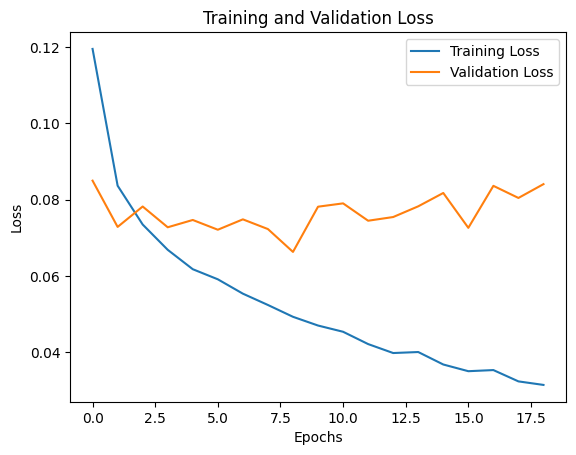

66/66 [==============================] - 117s 2s/step
Classification Report:
                        precision    recall  f1-score   support

               Amanita       0.84      0.74      0.79       105
           Cortinarius       0.90      0.36      0.52       105
              Entoloma       0.59      0.81      0.68       105
             Lactarius       0.54      0.67      0.60       105
     agaricus_bisporus       0.81      0.73      0.77       105
     agrocybe_aegerita       0.77      0.68      0.72       105
                bolete       0.75      0.74      0.75       105
      coprinus_comatus       0.86      0.95      0.90       105
           dictyophora       0.91      0.79      0.85       105
        enoki_mushroom       0.93      0.84      0.88       105
      hen-of-the-woods       0.90      0.85      0.87       105
              hericium       0.86      0.90      0.88       105
  hypsizigus_marmoreus       0.64      0.80      0.71       105
             matsutake    

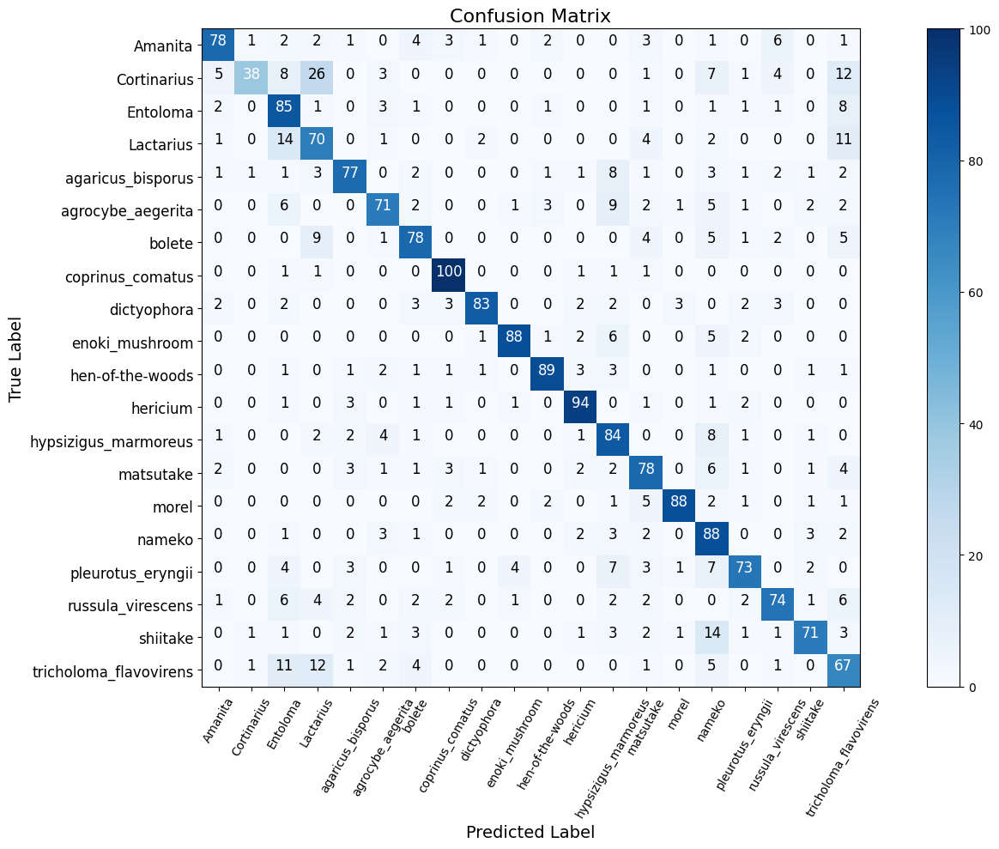

In [ ]:
model_path = dataset + "/evaluation/with_sharpen/mobilenet.h5"
history_path = dataset + "/evaluation/with_sharpen/mobileNet_training_log.csv"
evaluate_model(model_path, history_path, test_generator)

### **Xception**

43/66 [==================>...........] - ETA: 2:56 - loss: 0.0751 - accuracy: 0.7275

/usr/local/lib/python3.10/dist-packages/PIL/Image.py:996: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


66/66 [==============================] - 511s 8s/step - loss: 0.0764 - accuracy: 0.7190
Test Loss: 0.07636292278766632
Test Accuracy: 0.7190476059913635


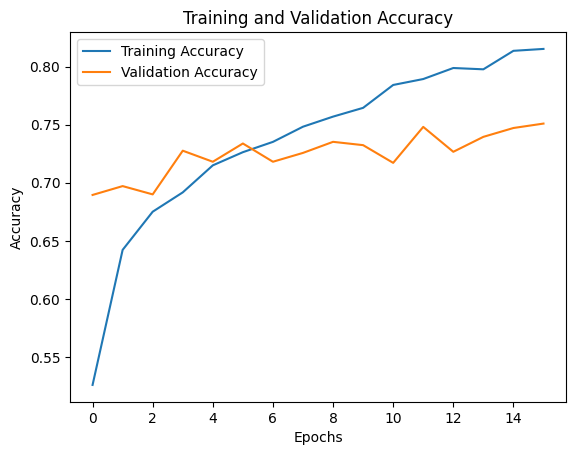

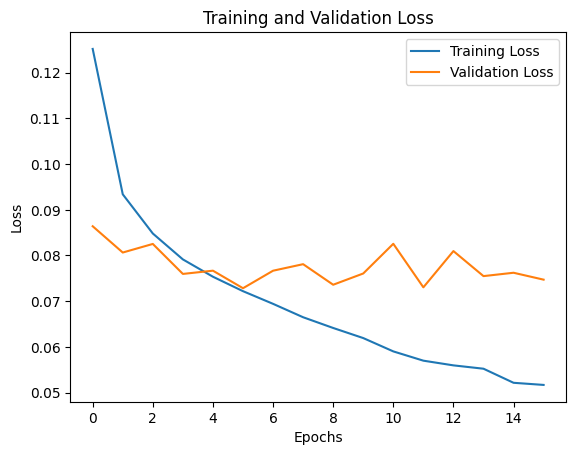

66/66 [==============================] - 500s 8s/step
Classification Report:
                        precision    recall  f1-score   support

               Amanita       0.63      0.69      0.65       105
           Cortinarius       0.68      0.42      0.52       105
              Entoloma       0.73      0.49      0.58       105
             Lactarius       0.65      0.51      0.57       105
     agaricus_bisporus       0.84      0.71      0.77       105
     agrocybe_aegerita       0.65      0.69      0.67       105
                bolete       0.55      0.78      0.64       105
      coprinus_comatus       0.82      0.91      0.86       105
           dictyophora       0.92      0.90      0.91       105
        enoki_mushroom       0.88      0.86      0.87       105
      hen-of-the-woods       0.84      0.92      0.88       105
              hericium       0.91      0.92      0.92       105
  hypsizigus_marmoreus       0.81      0.65      0.72       105
             matsutake    

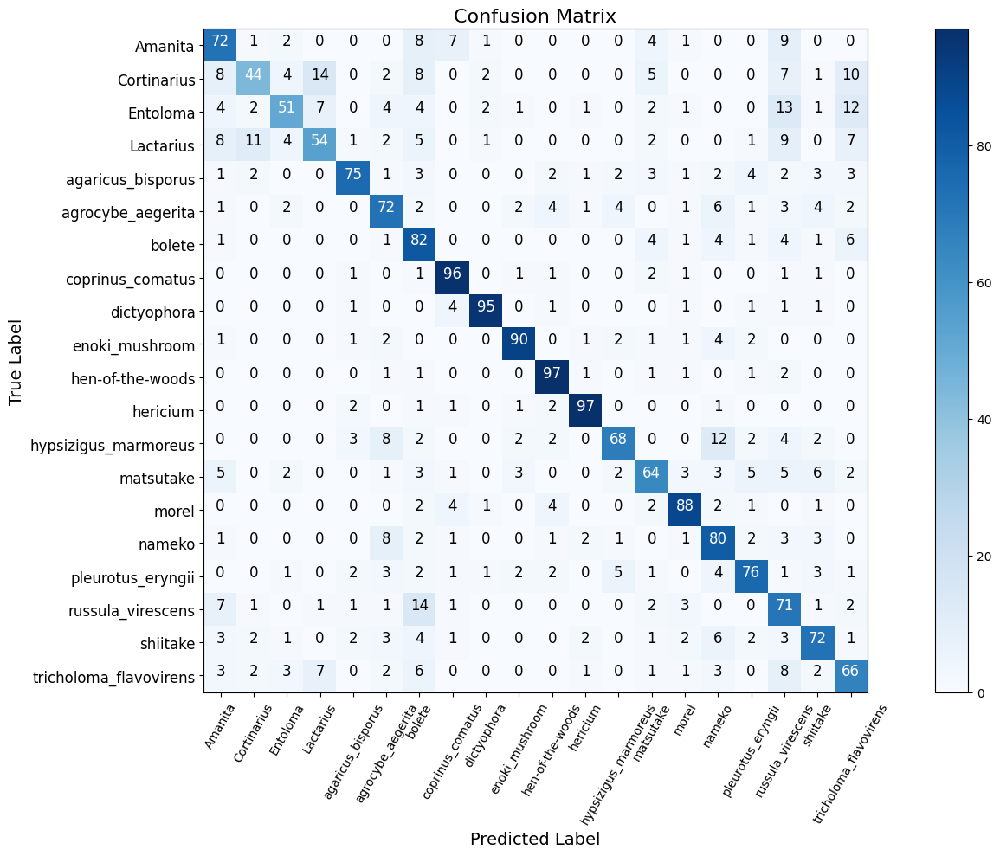

In [ ]:
model_path = dataset + "/evaluation/with_sharpen/xception.h5"
history_path = dataset + "/evaluation/with_sharpen/xception_training_log.csv"
evaluate_model(model_path, history_path, test_generator)

In [ ]:
import numpy as np
from tensorflow.keras.models import load_model

# Load the saved model
model = tf.keras.models.load_model(dataset + "/evaluation/wo_image_processing/mobilenet.h5")

class_indices = train_generator.class_indices
labels = dict((v, k) for k, v in class_indices.items())

class_correct = {classname: 0 for classname in labels.values()}
class_totals = {classname: 0 for classname in labels.values()}

# Iterate through all batches generated by test_generator
for i in range(len(test_generator)):
    # Get the batch of images and their labels
    batch_images, batch_labels = test_generator[i]

    # Predict the batch of images
    predictions = model.predict(batch_images)

    # Iterate through each prediction in the batch
    for j in range(len(predictions)):
        predicted_class_index = np.argmax(predictions[j])
        actual_class_index = np.argmax(batch_labels[j])

        predicted_class = labels[predicted_class_index]
        actual_class = labels[actual_class_index]

        if predicted_class == actual_class:
            class_correct[actual_class] += 1
        class_totals[actual_class] += 1

# Calculate accuracy for each class
class_accuracy = {classname: class_correct[classname] / class_totals[classname] for classname in class_totals}

# Print accuracy for each class
for classname, accuracy in class_accuracy.items():
    print(f'Accuracy for class {classname}: {accuracy * 100:.2f}%')


1/1 [==============================] - 1s 1s/step
Accuracy for class Amanita: 81.90%
Accuracy for class Cortinarius: 84.76%
Accuracy for class Entoloma: 73.33%
Accuracy for class Lactarius: 67.62%
Accuracy for class agaricus_bisporus: 84.76%
Accuracy for class agrocybe_aegerita: 80.00%
Accuracy for class bolete: 82.86%
Accuracy for class coprinus_comatus: 88.57%
Accuracy for class dictyophora: 85.71%
Accuracy for class enoki_mushroom: 87.62%
Accuracy for class hen-of-the-woods: 91.43%
Accuracy for class hericium: 89.52%
Accuracy for class hypsizigus_marmoreus: 80.00%
Accuracy for class matsutake: 82.86%
Accuracy for class morel: 91.43%
Accuracy for class nameko: 71.43%
Accuracy for class pleurotus_eryngii: 83.81%
Accuracy for class russula_virescens: 76.19%
Accuracy for class shiitake: 72.38%
Accuracy for class tricholoma_flavovirens: 72.38%


43/66 [==================>...........] - ETA: 38s

/usr/local/lib/python3.10/dist-packages/PIL/Image.py:996: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


66/66 [==============================] - 112s 2s/step


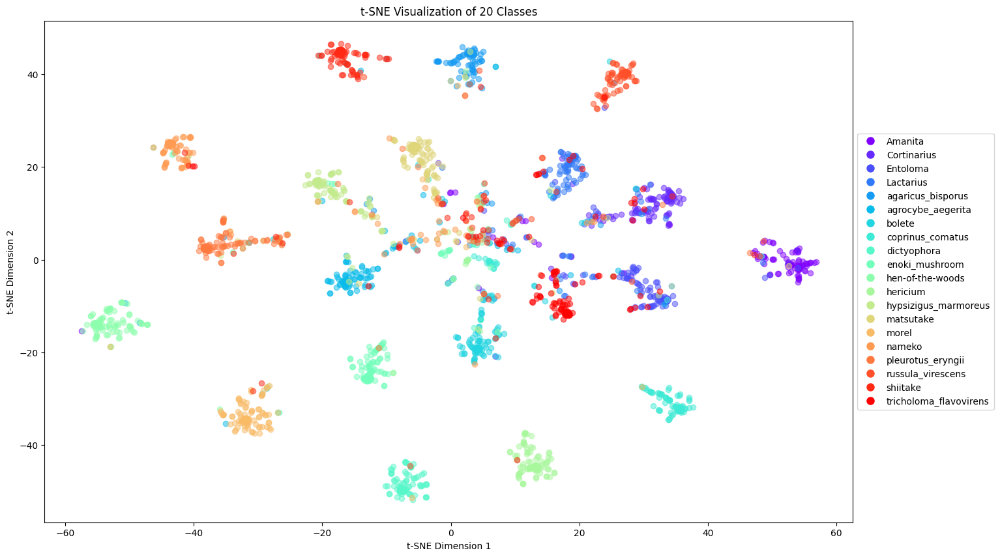

In [ ]:
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt
import numpy as np

model = tf.keras.models.load_model(dataset + "/evaluation/wo_image_processing/mobilenet.h5")

# Extract features from the model
features = model.predict(test_generator)

# Apply t-SNE
tsne = TSNE(n_components=2, random_state=42)
tsne_embeddings = tsne.fit_transform(features)

# Get the class labels
class_labels = test_generator.classes
unique_classes = np.unique(class_labels)

colors = plt.cm.rainbow(np.linspace(0, 1, len(unique_classes)))

plt.figure(figsize=(16, 10))
for i, class_label in enumerate(unique_classes):
    indices = [j for j, x in enumerate(class_labels) if x == class_label]
    plt.scatter(tsne_embeddings[indices, 0], tsne_embeddings[indices, 1], color=colors[i], label=f'Class {class_label}', alpha=0.5)

class_names = ['Amanita', 'Cortinarius', 'Entoloma', 'Lactarius', 'agaricus_bisporus', 'agrocybe_aegerita',
               'bolete', 'coprinus_comatus', 'dictyophora', 'enoki_mushroom', 'hen-of-the-woods', 'hericium',
               'hypsizigus_marmoreus', 'matsutake', 'morel', 'nameko', 'pleurotus_eryngii', 'russula_virescens',
               'shiitake', 'tricholoma_flavovirens']
handles = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=color, markersize=10, label=class_name) for class_name, color in zip(class_names, colors)]
plt.legend(handles=handles, loc='center left', bbox_to_anchor=(1, 0.5))

plt.title('t-SNE Visualization of 20 Classes')
plt.xlabel('t-SNE Dimension 1')
plt.ylabel('t-SNE Dimension 2')
plt.show()
